# Analyzing galaxies in the ELAIS-N1 field from NDWFS and LoTSS data

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from time import time, localtime, strftime
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [ ]:
### For ELAIS-N1 ###
field = 'EN1'
catalogue_file = 'en1_match_final.csv'
magphys_file = 'en1_magphys.csv'
map_lofar_file = 'en1_radio_image.fits'
map_100_file = 'ELAIS-N1_PACS100_v0.9.fits'
map_160_file = 'ELAIS-N1_PACS160_v0.9.fits'
map_250_file = 'ELAIS-N1_SPIRE250_v0.9.fits'
map_350_file = 'ELAIS-N1_SPIRE350_v0.9.fits'
map_500_file = 'ELAIS-N1_SPIRE500_v0.9.fits'

In [ ]:
path = "/home/bruno/Documents/COSMOamautas/Data/"+field+"/"

## Opening file and reading data onto a dataframe

### The following table includes galaxies already selected as having good quality data and not hosting luminous AGN, and cross-matched with the radio catalog from LoTSS Deep Fields DR1

In [4]:
# Selecting columns to read:
#columns = ['ID_1','RA_1','DEC_1','Z_BEST_1','z','Mass_median_2','K_flux','NUV_rest','r_rest_2','J_rest_2','F_MIPS_24_1','FErr_MIPS_24_u_1','FErr_MIPS_24_l_1','F_PACS_100_1','F_PACS_160_1','F_SPIRE_250_1','F_SPIRE_350_1','F_SPIRE_500_1','AGN_1','optAGN_1','IRAGN_1','XrayAGN_1','ch1_swire_flux','ch2_swire_flux','ch3_swire_flux','ch4_swire_flux','Peak_flux','Total_flux','S_Code']
#columns = ['RA_1','RA_2','DEC_1','DEC_2','Z_BEST_1','z','Mass_median_2','K_flux','NUV_rest','r_rest_2','J_rest_2','F_MIPS_24_1','F_MIPS_24_2','F_PACS_100_1','F_PACS_100_2','F_PACS_160_1','F_SPIRE_250_1','F_SPIRE_250_2','F_SPIRE_350_1','F_SPIRE_500_1','Peak_flux','Total_flux','S_Code']
columns = ['ID_1','RA_1','DEC_1','Z_BEST_1','z','Mass_median_2','K_flux','NUV_rest','r_rest_2','J_rest_2','F_MIPS_24_1','FErr_MIPS_24_u_1','FErr_MIPS_24_l_1','F_PACS_100_1','FErr_PACS_100_l_1','FErr_PACS_100_u_1','F_PACS_160_1','FErr_PACS_160_l_1','FErr_PACS_160_u_1','F_SPIRE_250_1','FErr_SPIRE_250_l_1','FErr_SPIRE_250_u_1','F_SPIRE_350_1','FErr_SPIRE_350_l_1','FErr_SPIRE_350_u_1','F_SPIRE_500_1','FErr_SPIRE_500_l_1','FErr_SPIRE_500_u_1','Peak_flux','Total_flux','S_Code']
start_time1 = time()
# Reading the data:
table = pd.read_csv(path+'Catalogues/'+catalogue_file,usecols=columns)
end_time1 = time()
print(f"Creating dataframe took {end_time1-start_time1:.4g} seconds!")
table['S_Code'] = table['S_Code'].astype("category")
table.info()
print(f"Number of galaxies in catalogue: {len(table)}")

Creating dataframe took 29.88 seconds!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 559344 entries, 0 to 559343
Data columns (total 31 columns):
 #   Column              Non-Null Count   Dtype   
---  ------              --------------   -----   
 0   ID_1                559344 non-null  int64   
 1   RA_1                559344 non-null  float64 
 2   DEC_1               559344 non-null  float64 
 3   K_flux              559344 non-null  float64 
 4   F_MIPS_24_1         216178 non-null  float64 
 5   FErr_MIPS_24_u_1    216178 non-null  float64 
 6   FErr_MIPS_24_l_1    216178 non-null  float64 
 7   F_PACS_100_1        138919 non-null  float64 
 8   FErr_PACS_100_u_1   138919 non-null  float64 
 9   FErr_PACS_100_l_1   138919 non-null  float64 
 10  F_PACS_160_1        138919 non-null  float64 
 11  FErr_PACS_160_u_1   138919 non-null  float64 
 12  FErr_PACS_160_l_1   138919 non-null  float64 
 13  F_SPIRE_250_1       138919 non-null  float64 
 14  FErr_SPIRE_250_u_1  138919 no

In [5]:
table.index = list(table['ID_1'])

## Getting rid of luminous AGN
We will discard entries of the catalog wich are likely to be luminous AGN and could thus be contaminating our sample. We will select them based on wether they are marked as AGN, or if they meet the IR AGN criteria presented by Donley et al. (2012).

In [7]:
print(f"Entries flagged as optical, IR or X-ray AGN: {np.count_nonzero(table['AGN_1'])}")
table['x'] = np.log10(table['ch3_swire_flux']/table['ch1_swire_flux'])
table['y'] = np.log10(table['ch4_swire_flux']/table['ch2_swire_flux'])
Donley = '(x>=0.08)&(y>=0.15)&(y>=(1.21*x)-0.27)&(y<=(1.21*x)+0.27)&(ch4_swire_flux>ch3_swire_flux>ch2_swire_flux>ch1_swire_flux)'
print(f"Entries that meet the Donley et al. (2012) IR AGN criteria: {len(table.query(Donley))}")

Entries flagged as optical, IR or X-ray AGN: 1281


/home/bruno/anaconda3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Entries that meet the Donley et al. (2012) IR AGN criteria: 4535


In [8]:
print(f"Total entries to be excluded for containing bright AGN: {len(table.query(Donley+'|(AGN_1==1)'))}")

Total entries to be excluded for containing bright AGN: 4921


In [9]:
table = table.query('~('+Donley+')')
table = table[table['AGN_1']==0]
print(f"Number of galaxies in sample: {len(table)}")

Number of galaxies in sample: 554423


In [11]:
not_AGN_index = table.index.to_frame(name='not_AGN_index')
not_AGN_index['ID'] = table['ID_1']
not_AGN_index.to_csv(path+'Results/indexes_notAGN_'+field+'_'+strftime("%Y-%m-%d",localtime())+'.csv',index=False)

In [4]:
numbers = pd.read_csv(path+'Results/indexes_notAGN_'+field+'_2021-08-31.csv')

table = table.loc[list(numbers['not_AGN_index'])]
table.info()
print(f"Number of galaxies in catalogue: {len(table)}")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 838900 entries, 0 to 848865
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   RA_1              838900 non-null  float64
 1   DEC_1             838900 non-null  float64
 2   Ks_flux           838900 non-null  float64
 3   F_MIPS_24_1       771887 non-null  float64
 4   FErr_MIPS_24_u_1  771887 non-null  float64
 5   FErr_MIPS_24_l_1  771887 non-null  float64
 6   F_PACS_100_1      250987 non-null  float64
 7   F_PACS_160_1      250987 non-null  float64
 8   F_SPIRE_250_1     261337 non-null  float64
 9   F_SPIRE_350_1     261337 non-null  float64
 10  F_SPIRE_500_1     261337 non-null  float64
 11  Z_BEST_1          838900 non-null  float64
 12  z                 838900 non-null  float64
 13  Mass_median_2     834684 non-null  float64
 14  R_rest_2          838663 non-null  float64
 15  J_rest_2          838663 non-null  float64
 16  NUV_rest          83

## Including results from MagPhys SED fitting

In [6]:
# Selecting columns to read:
columns = ['galaxy_id','Mstar_best','Mstar_50','SFR_best','SFR_50']
start_time1 = time()
# Reading the data:
magphys = pd.read_csv(path+'Catalogues/'+magphys_file,usecols=columns)
end_time1 = time()
print(f"Creating dataframe took {end_time1-start_time1:.4g} seconds!")
magphys.info()
print(f"Number of galaxies in catalogue: {len(magphys)}")

Creating dataframe took 5.374 seconds!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 183399 entries, 0 to 183398
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   galaxy_id   183399 non-null  int64  
 1   Mstar_best  183399 non-null  float64
 2   Mstar_50    183399 non-null  float64
 3   SFR_best    183399 non-null  float64
 4   SFR_50      183399 non-null  float64
dtypes: float64(4), int64(1)
memory usage: 7.0 MB
Number of galaxies in catalogue: 183399


In [7]:
magphys.index = list(magphys['galaxy_id'])

In [8]:
table = pd.concat([table,magphys],axis=1)

In [10]:
del magphys

## OPTIONAL
Only if there is a file containing the saved indices of a previously selected sample, use the following to open such file and filter the full dataframe according to the indices.
Then you can move on to the stacking section, but be sure not to skip the cells that add new columns to the dataframe.

In [11]:
numbers = pd.read_csv(path+'Results/indexes_selected_'+field+'_2021-08-31.csv')

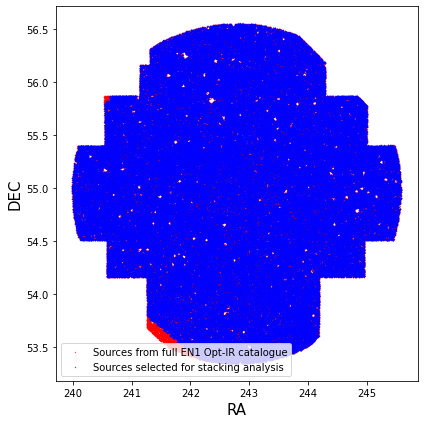

In [6]:
fig,ax = plt.subplots(figsize=(6,6))
ax.set_xlabel('RA',size=15)
ax.set_ylabel('DEC',size=15)
ax.scatter(table['RA_1'],table['DEC_1'],s=0.1,color='r',label='Sources from full '+field+' Opt-IR catalogue')
ax.scatter(table.loc[list(numbers['ID']),'RA_1'],table.loc[list(numbers['ID']),'DEC_1'],s=0.1,color='b',label='Sources selected for stacking analysis')
ax.legend(numpoints=1,loc='best')
fig.tight_layout()
plt.show()

In [13]:
table = table.loc[list(numbers['ID'])]
table.info()
print(f"Number of galaxies in catalogue: {len(table)}")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 341981 entries, 984935 to 1574416
Data columns (total 36 columns):
 #   Column              Non-Null Count   Dtype   
---  ------              --------------   -----   
 0   ID_1                341981 non-null  float64 
 1   RA_1                341981 non-null  float64 
 2   DEC_1               341981 non-null  float64 
 3   K_flux              341981 non-null  float64 
 4   F_MIPS_24_1         179126 non-null  float64 
 5   FErr_MIPS_24_u_1    179126 non-null  float64 
 6   FErr_MIPS_24_l_1    179126 non-null  float64 
 7   F_PACS_100_1        122933 non-null  float64 
 8   FErr_PACS_100_u_1   122933 non-null  float64 
 9   FErr_PACS_100_l_1   122933 non-null  float64 
 10  F_PACS_160_1        122933 non-null  float64 
 11  FErr_PACS_160_u_1   122933 non-null  float64 
 12  FErr_PACS_160_l_1   122933 non-null  float64 
 13  F_SPIRE_250_1       122933 non-null  float64 
 14  FErr_SPIRE_250_u_1  122933 non-null  float64 
 15  FErr_SPIRE_

## Getting rid of invalid values

Since we will be selecting galaxies based on their rest-frame NUV-R and R-J colors, we shall first discard those entries with invalid values in these fields, such as 'nan' or 'inf', as well as those with negative fluxes in the Ks band. We will also exclude sources with invalid (<0) redshift values.

In [6]:
pd.options.mode.use_inf_as_na = True
table.dropna(subset=['NUV_rest','r_rest_2','J_rest_2','z','Z_BEST_1'],inplace=True)
table = table[(table['K_flux']>0) & (table['Z_BEST_1']>0)]
print(f"Number of galaxies in sample: {len(table)}")

Number of galaxies in sample: 518867


In [7]:
print(np.count_nonzero(~np.isfinite(table['Mass_median_2'])))
print(np.count_nonzero(~np.isfinite(table['Z_BEST_1'])))

3716
0


 A small number of sources are missing stellar mass estimates. Here we will also get rid of those.

In [8]:
table.dropna(subset=['Mass_median_2'],inplace=True)
print(f"Number of galaxies in sample: {len(table)}")

Number of galaxies in sample: 515151


## Redshift and stellar mass distribution

We can take a look at the distribution of important properties of the galaxies in our sample, such as redshift and stellar mass.

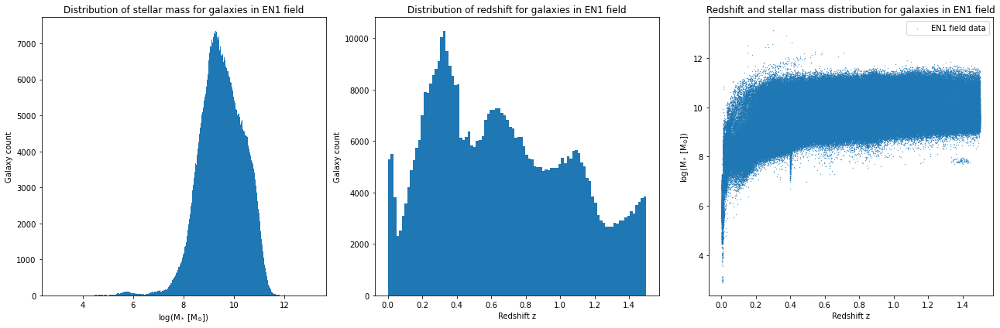

In [9]:
fig, ax = plt.subplots(1,3,figsize=(18,6))
# Plotting stellar mass histogram
ax[0].set_title('Distribution of stellar mass for galaxies in '+field+' field')
ax[0].set_xlabel('log(M$_*$ [M$_{\odot}$])')
ax[0].set_ylabel('Galaxy count')
ax[0].hist(table['Mass_median_2'], 'auto')
# Plotting redshift histogram
ax[1].set_title('Distribution of redshift for galaxies in '+field+' field')
ax[1].set_xlabel('Redshift z')
ax[1].set_ylabel('Galaxy count')
ax[1].hist(table['z'], 'auto')
# Plotting Stellar mass vs Redshift
ax[2].set_title('Redshift and stellar mass distribution for galaxies in '+field+' field')
ax[2].set_xlabel("Redshift z",fontsize=10)
ax[2].set_ylabel("log(M$_*$ [M$_{\odot}$])",fontsize=10)
ax[2].scatter(table['z'],table['Mass_median_2'],s=0.1,label=field+' field data')
ax[2].legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

In [5]:
#z1=np.arange(0,1.6,0.1)

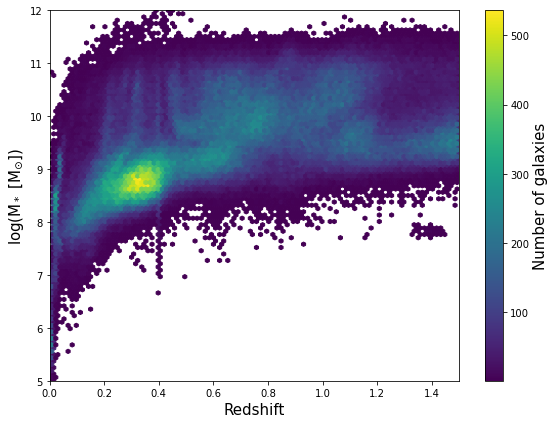

In [10]:
fig, ax = plt.subplots(figsize=(8,6))
# Plotting Ks magnitude vs Redshift
ax.set_xlabel("Redshift",fontsize=15)
ax.set_ylabel("log(M$_*$ [M$_{\odot}$])",fontsize=15)
hb = ax.hexbin(table.loc[(table['Mass_median_2']>5)&(table['Mass_median_2']<12),'z'],
               table.loc[(table['Mass_median_2']>5)&(table['Mass_median_2']<12),'Mass_median_2'],mincnt=1,label=field+' field data')
cb = fig.colorbar(hb, ax=ax)
cb.set_label('Number of galaxies',fontsize=15)
#ax.plot(z1,10.6+2.28*np.log10(z1/0.1),c='k')
ax.set_xlim(xmin=0,xmax=1.5)
ax.set_ylim(ymin=5,ymax=12)
fig.tight_layout()
plt.show()

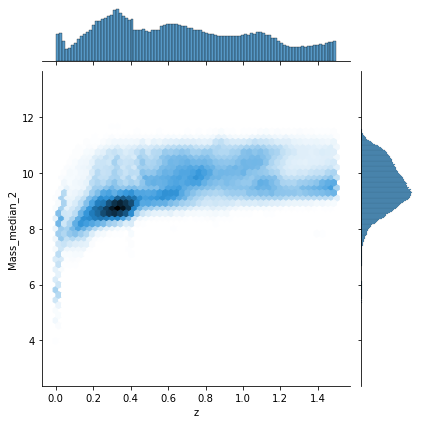

In [11]:
sns.jointplot(x=table['z'], y=table['Mass_median_2'], kind="hex")#, color="k")

## K magnitude distribution

We can also check the distribution of galaxies according to their flux and magnitude in the Ks band. To obtain the magnitudes in the AB system, we shall create a function to perform the appropriate conversion.

In [12]:
def uJyToAB(fluxuJy):
    '''Converts flux in micro Jansky to AB magnitude, with a zeropoint of ~ 3631 Jansky
    Conversion taken from www.star.bristol.ac.uk/~mbt/stilts/sun256/uk.ac.starlink.ttools.func.Fluxes.html'''
    return 23.9-2.5*np.log10(fluxuJy) #2.5*(23+6-np.log10(fluxuJy))-48.6

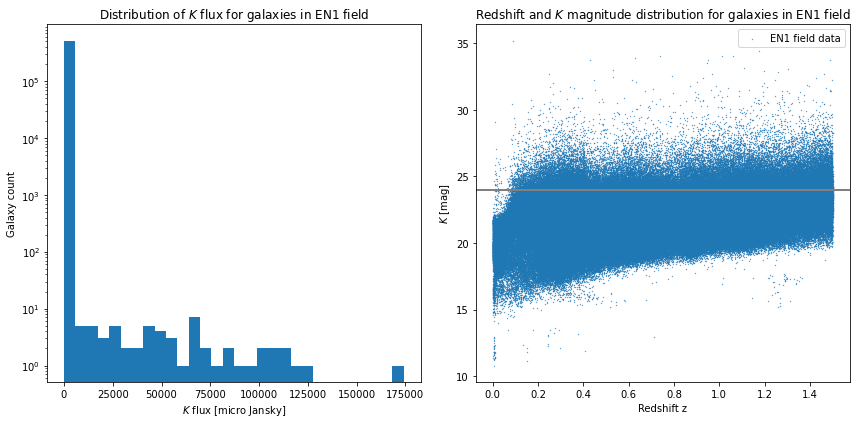

In [13]:
fig, ax = plt.subplots(1,2,figsize=(12,6))
# Plotting Ks flux histogram
ax[0].set_title('Distribution of $K$ flux for galaxies in '+field+' field')
ax[0].set_xlabel('$K$ flux [micro Jansky]')
ax[0].set_ylabel('Galaxy count')
ax[0].set_yscale('log')
ax[0].hist(table['K_flux'], bins=30)#'auto')
# Plotting Ks magnitude vs Redshift
ax[1].set_title('Redshift and $K$ magnitude distribution for galaxies in '+field+' field')
ax[1].set_xlabel("Redshift z",fontsize=10)
ax[1].set_ylabel("$K$ [mag]",fontsize=10)
ax[1].scatter(table['z'],uJyToAB(table['K_flux']),s=0.1,label=field+' field data')
ax[1].axhline(24,color='0.5',linewidth=2)
ax[1].legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

Because the colors have saturated in the scatter plot, using a 2D histogram allows us to appreciate better the distribution of redshifts and magnitudes.

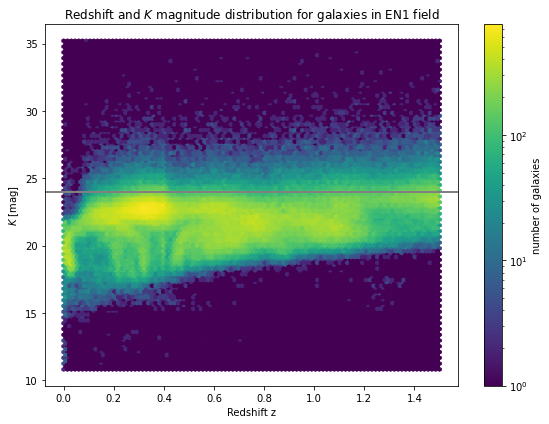

In [14]:
fig, ax = plt.subplots(figsize=(8,6))
# Plotting Ks magnitude vs Redshift
ax.set_title('Redshift and $K$ magnitude distribution for galaxies in '+field+' field')
ax.set_xlabel("Redshift z",fontsize=10)
ax.set_ylabel("$K$ [mag]",fontsize=10)
hb = ax.hexbin(table['z'],uJyToAB(table['K_flux']),bins='log',label=field+' field data')
cb = fig.colorbar(hb, ax=ax)
cb.set_label('number of galaxies')
ax.axhline(24,color='0.5',linewidth=2)
#ax.legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

Following the sample specifications of Ilbert et al. 2013 and Man et al. 2016, we will limit our sample to those galaxies with Ks < 24. As can be seen in the figure above, the majority of the sample is still included after applying this cut.

In [16]:
# Making cut in Ks magnitude
table = table[uJyToAB(table['K_flux'])<24]
print(f"Number of galaxies in sample: {len(table)}")

Number of galaxies in sample: 464214


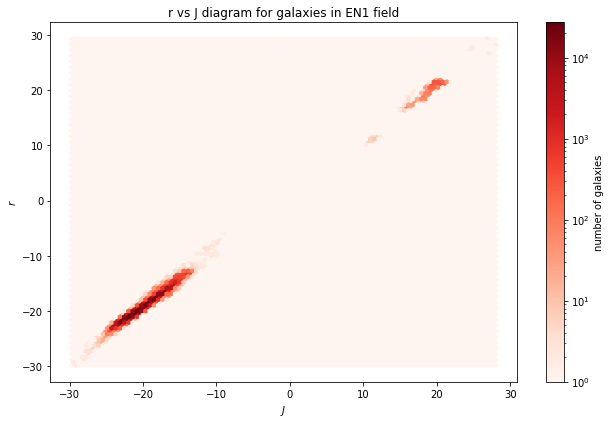

In [17]:
fig, axs = plt.subplots(figsize=(9,6))
axs.set_title('r vs J diagram for galaxies in '+field+' field')
axs.set_xlabel(f"$J$",fontsize=10)
axs.set_ylabel(f"$r$",fontsize=10)
hb = axs.hexbin(table['J_rest_2'],table['r_rest_2'],bins='log',cmap='Reds')
cb = fig.colorbar(hb, ax=axs)
cb.set_label('number of galaxies')
fig.tight_layout()
plt.show()

Here we get rid of the few sources with rest-frame R magnitudes higher than 0, since those are unrealistic for massive galaxies. This will also get rid of sources with rest-frame J and NUV magnitudes higher than 0.

In [22]:
# Making cut in R magnitude
table = table[(table['NUV_rest']<0)&(table['r_rest_2']<0)&(table['J_rest_2']<0)]
print(f"Number of galaxies in sample: {len(table)}")

Number of galaxies in sample: 460761


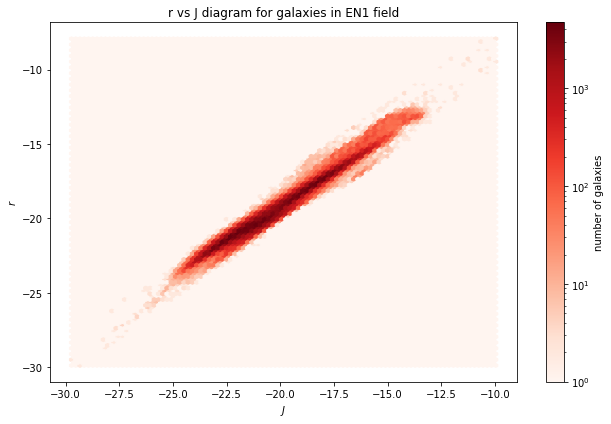

In [23]:
fig, axs = plt.subplots(figsize=(9,6))
axs.set_title('r vs J diagram for galaxies in '+field+' field')
axs.set_xlabel(f"$J$",fontsize=10)
axs.set_ylabel(f"$r$",fontsize=10)
hb = axs.hexbin(table['J_rest_2'],table['r_rest_2'],bins='log',cmap='Reds')
cb = fig.colorbar(hb, ax=axs)
cb.set_label('number of galaxies')
fig.tight_layout()
plt.show()

In [24]:
print(len(table))
print(len(table[table['z']>0.1]))
print(len(table[table['Mass_median_2']>=9]))

460761
441069
346543


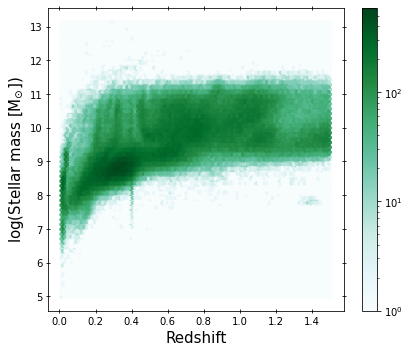

In [25]:
fig, ax = plt.subplots(figsize=(6,5))
table.plot.hexbin(x='z',y='Mass_median_2',bins='log',ax=ax)
ax.set_xlabel('Redshift',size=15)
ax.set_ylabel('log(Stellar mass [M$_{\odot}$])',size=15)
#ax.set_xlim(0.1,1.5)
#ax.set_ylim(7,12)
ax.tick_params(which='both',top=True,right=True,direction='inout')
fig.tight_layout()
plt.show()

Because we are interested in studying galaxies at high redshift, here we will discard the entries with redshift values below 0.1. We will exclude galaxies with low values of stellar mass. Previous tests have shown that our analysis is sensitive for sources above 1000,000,000 solar masses, so we will restrict our sample to that range.

In [26]:
table = table[table['z']>0.1]
table = table[table['Mass_median_2']>=9]

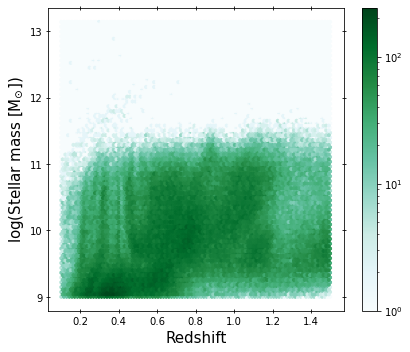

In [27]:
fig, ax = plt.subplots(figsize=(6,5))
table.plot.hexbin(x='z',y='Mass_median_2',bins='log',ax=ax)
ax.set_xlabel('Redshift',size=15)
ax.set_ylabel('log(Stellar mass [M$_{\odot}$])',size=15)
#ax.set_xlim(0.1,1.5)
#ax.set_ylim(7,12)
ax.tick_params(which='both',top=True,right=True,direction='inout')
fig.tight_layout()
plt.show()

## Exploring color-color space

By choosing three rest-frame bands (in this case, NUV, R and J), we can define two colors which we will use to select galaxies as quiescent or star-forming. In order to have easy acces to these colors for later operations, we will add two new columns to the table based on the values of other columns.

In [14]:
### DON'T SKIP ###
table['NUVR'] = table['NUV_rest']-table['r_rest_2']
table['RJ'] = table['r_rest_2']-table['J_rest_2']

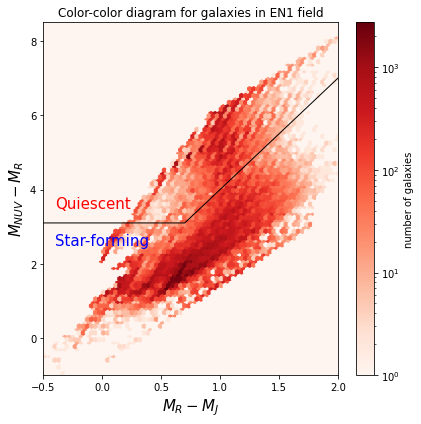

In [29]:
fig, axs = plt.subplots(figsize=(6,6))
axs.set_title('Color-color diagram for galaxies in '+field+' field')
axs.set_xlabel("$M_{R} - M_{J}$",fontsize=15)
axs.set_ylabel("$M_{NUV} - M_{R}$",fontsize=15)
hb = axs.hexbin(table['RJ'],table['NUVR'],bins='log',cmap='Reds')
cb = fig.colorbar(hb, ax=axs)
cb.set_label('number of galaxies')
axs.plot([-80,0.7,80],[3.1,3.1,241],color='k',linewidth=1,label='Color selection boundary')
axs.set_xlim(xmin=-0.5,xmax=2.)
axs.set_ylim(ymin=-1,ymax=8.5)
axs.text(-0.4,3.5,'Quiescent',size=15,color='r')
axs.text(-0.4,2.5,'Star-forming',size=15,color='b')
fig.tight_layout()
plt.show()

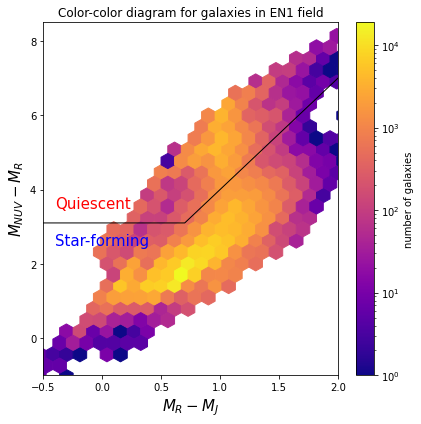

In [30]:
fig, axs = plt.subplots(figsize=(6,6))
axs.set_title('Color-color diagram for galaxies in '+field+' field')
axs.set_xlabel("$M_{R} - M_{J}$",fontsize=15)
axs.set_ylabel("$M_{NUV} - M_{R}$",fontsize=15)
hb = axs.hexbin(table['RJ'],table['NUVR'],bins='log',mincnt=1,cmap='plasma',gridsize=30)
cb = fig.colorbar(hb, ax=axs)
cb.set_label('number of galaxies')
axs.plot([-80,0.7,80],[3.1,3.1,241],color='k',linewidth=1,label='Color selection boundary')
axs.set_xlim(xmin=-0.5,xmax=2.)
axs.set_ylim(ymin=-1,ymax=8.5)
axs.text(-0.4,3.5,'Quiescent',size=15,color='r')
axs.text(-0.4,2.5,'Star-forming',size=15,color='b')
fig.tight_layout()
plt.show()

We can calculate the fraction of galaxies within the 'quiescent region', and the fraction of those that have viable data at 24 micron from MIPS.

In [15]:
### DON'T SKIP ###
quiescent = '((NUVR>3.1)&(NUVR>3*RJ+1))'
SF = '((NUVR<=3.1)|(NUVR<=3*RJ+1))'
MIPSSNR3 = '(F_MIPS_24_1>3*(FErr_MIPS_24_u_1-F_MIPS_24_1))&(F_MIPS_24_1>3*(F_MIPS_24_1-FErr_MIPS_24_l_1))'
MIPSSNR5 = '(F_MIPS_24_1>5*(FErr_MIPS_24_u_1-F_MIPS_24_1))&(F_MIPS_24_1>5*(F_MIPS_24_1-FErr_MIPS_24_l_1))'

In [32]:
final_sample=len(table)
n_quiescent = len(table.query(quiescent))
n_star_forming = len(table.query(SF))
print(f"Number of galaxies in sample: {final_sample}\n")
print(f"Number of quiescent galaxies in the sample: {n_quiescent}")
q_MIPS = len(table.query(quiescent).loc[np.isfinite(table['F_MIPS_24_1']),:])
print(f"Fraction of quiescent galaxies with MIPS data: {q_MIPS/n_quiescent:.2%}")
q_MIPSgt0 = len(table.query(quiescent+'&(F_MIPS_24_1>0)'))
print(f"Fraction of quiescent galaxies with MIPS flux > 0 uJy: {q_MIPSgt0/n_quiescent:.2%}")
q_MIPSSN = len(table.query(quiescent+'&'+MIPSSNR3))
print(f"Fraction of quiescent galaxies with MIPS S/N > 3: {q_MIPSSN/n_quiescent:.2%}")
q_MIPSSN = len(table.query(quiescent+'&'+MIPSSNR5))
print(f"Fraction of quiescent galaxies with MIPS S/N > 5: {q_MIPSSN/n_quiescent:.2%}\n")
print(f"Number of star-forming galaxies in the sample: {n_star_forming}")
sf_MIPS = len(table.query(SF).loc[np.isfinite(table['F_MIPS_24_1']),:])
print(f"Fraction of star-forming galaxies with MIPS data: {sf_MIPS/n_star_forming:.2%}")
sf_MIPSgt0 = len(table.query(SF+'&(F_MIPS_24_1>0)'))
print(f"Fraction of star-forming galaxies with MIPS flux > 0 uJy: {sf_MIPSgt0/n_star_forming:.2%}")
sf_MIPSSN = len(table.query(SF+'&'+MIPSSNR3))
print(f"Fraction of star-forming galaxies with MIPS S/N > 3: {sf_MIPSSN/n_star_forming:.2%}")
sf_MIPSSN = len(table.query(SF+'&'+MIPSSNR5))
print(f"Fraction of star-forming galaxies with MIPS S/N > 5: {sf_MIPSSN/n_star_forming:.2%}")

Number of galaxies in sample: 343811

Number of quiescent galaxies in the sample: 70446
Fraction of quiescent galaxies with MIPS data: 66.75%
Fraction of quiescent galaxies with MIPS flux > 0 uJy: 66.75%
Fraction of quiescent galaxies with MIPS S/N > 3: 19.96%
Fraction of quiescent galaxies with MIPS S/N > 5: 10.89%

Number of star-forming galaxies in the sample: 273365
Fraction of star-forming galaxies with MIPS data: 48.46%
Fraction of star-forming galaxies with MIPS flux > 0 uJy: 48.46%
Fraction of star-forming galaxies with MIPS S/N > 3: 30.59%
Fraction of star-forming galaxies with MIPS S/N > 5: 23.81%


In [10]:
final_sample=len(table)
n_quiescent = len(table.query(quiescent))
n_star_forming = len(table.query(SF))
print(f"Number of galaxies in sample: {final_sample}\n")
print(f"Number of quiescent galaxies in the sample: {n_quiescent}")
q_MIPS = len(table.query(quiescent).loc[np.isfinite(table['F_MIPS_24_1']),:])
print(f"Fraction of quiescent galaxies with MIPS data: {q_MIPS/n_quiescent:.2%}")
q_MIPSgt0 = len(table.query(quiescent+'&(F_MIPS_24_1>0)'))
print(f"Fraction of quiescent galaxies with MIPS flux > 0 uJy: {q_MIPSgt0/n_quiescent:.2%}")
q_MIPSSN = len(table.query(quiescent+'&'+MIPSSNR3))
print(f"Fraction of quiescent galaxies with MIPS S/N > 3: {q_MIPSSN/n_quiescent:.2%}")
q_MIPSSN = len(table.query(quiescent+'&'+MIPSSNR5))
print(f"Fraction of quiescent galaxies with MIPS S/N > 5: {q_MIPSSN/n_quiescent:.2%}\n")
print(f"Number of star-forming galaxies in the sample: {n_star_forming}")
sf_MIPS = len(table.query(SF).loc[np.isfinite(table['F_MIPS_24_1']),:])
print(f"Fraction of star-forming galaxies with MIPS data: {sf_MIPS/n_star_forming:.2%}")
sf_MIPSgt0 = len(table.query(SF+'&(F_MIPS_24_1>0)'))
print(f"Fraction of star-forming galaxies with MIPS flux > 0 uJy: {sf_MIPSgt0/n_star_forming:.2%}")
sf_MIPSSN = len(table.query(SF+'&'+MIPSSNR3))
print(f"Fraction of star-forming galaxies with MIPS S/N > 3: {sf_MIPSSN/n_star_forming:.2%}")
sf_MIPSSN = len(table.query(SF+'&'+MIPSSNR5))
print(f"Fraction of star-forming galaxies with MIPS S/N > 5: {sf_MIPSSN/n_star_forming:.2%}")

Number of galaxies in sample: 341981

Number of quiescent galaxies in the sample: 70084
Fraction of quiescent galaxies with MIPS data: 66.98%
Fraction of quiescent galaxies with MIPS flux > 0 uJy: 66.98%
Fraction of quiescent galaxies with MIPS S/N > 3: 20.02%
Fraction of quiescent galaxies with MIPS S/N > 5: 10.92%

Number of star-forming galaxies in the sample: 271897
Fraction of star-forming galaxies with MIPS data: 48.62%
Fraction of star-forming galaxies with MIPS flux > 0 uJy: 48.62%
Fraction of star-forming galaxies with MIPS S/N > 3: 30.68%
Fraction of star-forming galaxies with MIPS S/N > 5: 23.88%


## Opening LOFAR and Herschel maps for selected field

In [ ]:
### DON'T SKIP ###
from astropy.io import fits
from astropy.nddata import Cutout2D
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy import wcs
#from astropy.wcs.utils import pixel_to_skycoord

In [17]:
# Opening LOFAR map
hdulist = fits.open(path+'Maps/'+map_lofar_file,memmap=True)
w_lofar = wcs.WCS(hdulist[0].header,naxis=2) # TAKE ONLY THE FIRST 2 DIMENSIONS (RA,DEC)

hdulist[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    4 / number of array dimensions                     
NAXIS1  =                14000                                                  
NAXIS2  =                14000                                                  
NAXIS3  =                    1                                                  
NAXIS4  =                    1                                                  
WCSAXES =                    4 / Number of coordinate axes                      
CRPIX1  =               7001.0 / Pixel coordinate of reference point            
CRPIX2  =               7001.0 / Pixel coordinate of reference point            
CRPIX3  =                  1.0 / Pixel coordinate of reference point            
CRPIX4  =                  1.0 / Pixel coordinate of reference point            
CDELT1  = -0.000416666666666

In [18]:
print(w_lofar)
unit_lofar = hdulist[0].header['BUNIT'].replace(' ','')
print("Map unit : ",unit_lofar)
pixscale_lofar = hdulist[0].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print("Pixel scale : ",pixscale_lofar," arcseconds")
imdata_lofar = hdulist[0].data[0][0] # TAKING ONLY THE FIRST 2 DIMENSIONS (RA,DEC)
hdulist.close()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---SIN'  'DEC--SIN'  
CRVAL : 242.75  55.0  
CRPIX : 7001.0  7001.0  
PC1_1 PC1_2  : 1.0  0.0  
PC2_1 PC2_2  : 0.0  1.0  
CDELT : -0.00041666666666667  0.00041666666666667  
NAXIS : 14000  14000  1  1
Map unit :  Jy/beam
Pixel scale :  1.500000000000012  arcseconds


In [19]:
# Opening SPIRE 250 map
hdulist = fits.open(path+'Maps/'+map_250_file,memmap=True)
w_250 = wcs.WCS(hdulist[1].header)

hdulist[1].header

XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                  -64 / Number of bits per data pixel                  
NAXIS   =                    2 / Number of data axes                            
NAXIS1  =                 3169 /                                                
NAXIS2  =                 3063 /                                                
PCOUNT  =                    0 / No Group Parameters                            
GCOUNT  =                    1 / One Data Group                                 
COMMENT                                                                         
COMMENT  This is a header for an SMAP pipeline product.                         
COMMENT                                                                         
TIMESYS = 'UTC     '           / All dates are in UTC time                      
CREATOR = 'SMAP    '           / User who created this header                   
DATE    = '2015-03-13T07:20:

In [20]:
print(w_250)
unit_250 = hdulist[1].header['BUNIT'].replace(' ','')
print("Map unit : ",unit_250)
pixscale_250 = hdulist[1].header['CD2_2']*3600 # PIXEL SCALE IN ARCSEC
print("Pixel scale : ",pixscale_250," arcseconds")
imdata_250 = hdulist[1].data
hdulist.close()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 242.912445068  55.0338821411  
CRPIX : 1585.0  1510.0  
CD1_1 CD1_2  : -0.00166666670702  0.0  
CD2_1 CD2_2  : 0.0  0.00166666670702  
NAXIS : 3169  3063
Map unit :  Jy/beam
Pixel scale :  6.000000145272001  arcseconds


In [21]:
# Opening SPIRE 350 map
hdulist = fits.open(path+'Maps/'+map_350_file,memmap=True)
w_350 = wcs.WCS(hdulist[1].header)

hdulist[1].header

XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                  -64 / Number of bits per data pixel                  
NAXIS   =                    2 / Number of data axes                            
NAXIS1  =                 2281 /                                                
NAXIS2  =                 2205 /                                                
PCOUNT  =                    0 / No Group Parameters                            
GCOUNT  =                    1 / One Data Group                                 
COMMENT                                                                         
COMMENT  This is a header for an SMAP pipeline product.                         
COMMENT                                                                         
TIMESYS = 'UTC     '           / All dates are in UTC time                      
CREATOR = 'SMAP    '           / User who created this header                   
DATE    = '2015-03-13T07:20:

In [22]:
print(w_350)
unit_350 = hdulist[1].header['BUNIT'].replace(' ','')
print("Map unit : ",unit_350)
pixscale_350 = hdulist[1].header['CD2_2']*3600 # PIXEL SCALE IN ARCSEC
print("Pixel scale : ",pixscale_350," arcseconds")
imdata_350 = hdulist[1].data
hdulist.close()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 242.912445068  55.0338821411  
CRPIX : 1141.0  1087.0  
CD1_1 CD1_2  : -0.00231481483206  0.0  
CD2_1 CD2_2  : 0.0  0.00231481483206  
NAXIS : 2281  2205
Map unit :  Jy/beam
Pixel scale :  8.333333395416  arcseconds


In [23]:
# Opening SPIRE 500 map
hdulist = fits.open(path+'Maps/'+map_500_file,memmap=True)
w_500 = wcs.WCS(hdulist[1].header)

hdulist[1].header

XTENSION= 'IMAGE   '           / IMAGE extension                                
BITPIX  =                  -64 / Number of bits per data pixel                  
NAXIS   =                    2 / Number of data axes                            
NAXIS1  =                 1585 /                                                
NAXIS2  =                 1532 /                                                
PCOUNT  =                    0 / No Group Parameters                            
GCOUNT  =                    1 / One Data Group                                 
COMMENT                                                                         
COMMENT  This is a header for an SMAP pipeline product.                         
COMMENT                                                                         
TIMESYS = 'UTC     '           / All dates are in UTC time                      
CREATOR = 'SMAP    '           / User who created this header                   
DATE    = '2015-03-13T07:20:

In [24]:
print(w_500)
unit_500 = hdulist[1].header['BUNIT'].replace(' ','')
print("Map unit : ",unit_500)
pixscale_500 = hdulist[1].header['CD2_2']*3600 # PIXEL SCALE IN ARCSEC
print("Pixel scale : ",pixscale_500," arcseconds")
imdata_500 = hdulist[1].data
hdulist.close()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 242.912445068  55.0338821411  
CRPIX : 793.0  755.0  
CD1_1 CD1_2  : -0.00333333341405  0.0  
CD2_1 CD2_2  : 0.0  0.00333333341405  
NAXIS : 1585  1532
Map unit :  Jy/beam
Pixel scale :  12.00000029058  arcseconds


In [25]:
# Opening PACS 100 map
hdulist = fits.open(path+'Maps/'+map_100_file,memmap=True)
w_100 = wcs.WCS(hdulist[1].header)

hdulist[1].header

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                  -32 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 8828                                                  
NAXIS2  =                 8902                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
IMG_TYPE= 'wgls    '                                                            
CTYPE1  = 'RA---TAN'                                                            
CTYPE2  = 'DEC--TAN'                                                            
CRPIX1  =          4413.160156                                                  
CRPIX2  =          4450.265625                                                  
CRVAL1  =          243.45225

In [26]:
print(w_100)
unit_100 = hdulist[1].header['BUNIT'].replace(' ','')
print("Map unit : ",unit_100)
pixscale_100 = hdulist[1].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print("Pixel scale : ",pixscale_100," arcseconds")
imdata_100 = hdulist[1].data
hdulist.close()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 243.4522552  55.07836914  
CRPIX : 4413.160156  4450.265625  
NAXIS : 8828  8902
Map unit :  MJy/sr
Pixel scale :  2.0000000484  arcseconds


In [27]:
# Opening PACS 160 map
hdulist = fits.open(path+'Maps/'+map_160_file,memmap=True)
w_160 = wcs.WCS(hdulist[1].header)

hdulist[1].header

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                  -32 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 5884                                                  
NAXIS2  =                 5934                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
IMG_TYPE= 'wgls    '                                                            
CTYPE1  = 'RA---TAN'                                                            
CTYPE2  = 'DEC--TAN'                                                            
CRPIX1  =          2941.150879                                                  
CRPIX2  =          2966.175781                                                  
CRVAL1  =          243.45153

In [28]:
print(w_160)
unit_160 = hdulist[1].header['BUNIT'].replace(' ','')
print("Map unit : ",unit_160)
pixscale_160 = hdulist[1].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print("Pixel scale : ",pixscale_160," arcseconds")
imdata_160 = hdulist[1].data
hdulist.close()

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---TAN'  'DEC--TAN'  
CRVAL : 243.4515381  55.07705688  
CRPIX : 2941.150879  2966.175781  
NAXIS : 5884  5934
Map unit :  MJy/sr
Pixel scale :  3.0000000726000002  arcseconds


In [29]:
fwhm_lofar = 6.0
fwhm_100 = 6.8
fwhm_160 = 11.0
fwhm_250 = 18.2
fwhm_350 = 24.9
fwhm_500 = 36.3

## Removing sources not found in maps

In [47]:
def create_mask(image_data,W,pixscale,FWHM):
    bool_mask=[]
    for ra,dec in zip(table.loc[:,'RA_1'],table.loc[:,'DEC_1']):
        world_coords = [ra,dec]                                # world coordinates
        pixel_coords = W.all_world2pix([world_coords], 0)      # pixel coordinates
        position = (pixel_coords[0][0],pixel_coords[0][1])     # position to create cutout
        size = (FWHM*2/pixscale+2, FWHM*2/pixscale+2)          # cutout size in pixels
        try:
            cutout = Cutout2D(image_data, position, size, mode='partial') # create cutout, no trimming
        except:
            bool_mask.append(False)
            continue
        
        if np.isnan(cutout.data).any():
            bool_mask.append(False)
        else:
            bool_mask.append(True)
    return bool_mask

In [48]:
bool_mask = create_mask(imdata_100,w_100,pixscale_100,fwhm_100)
print(len(bool_mask))
print('Sources confirmed in PACS 100 micron map:', np.count_nonzero(bool_mask))

343811
Sources confirmed in PACS 100 micron map: 342051


In [49]:
table = table[bool_mask]
len(table)

bool_mask = create_mask(imdata_160,w_160,pixscale_160,fwhm_160)
print(len(bool_mask))
print('Sources confirmed in PACS 160 micron map:', np.count_nonzero(bool_mask))

342051
Sources confirmed in PACS 160 micron map: 341981


In [50]:
table = table[bool_mask]
len(table)

bool_mask = create_mask(imdata_250,w_250,pixscale_250,fwhm_250)
print(len(bool_mask))
print('Sources confirmed in SPIRE 250 micron map:', np.count_nonzero(bool_mask))

341981
Sources confirmed in SPIRE 250 micron map: 341981


In [51]:
table = table[bool_mask]
len(table)

bool_mask = create_mask(imdata_350,w_350,pixscale_350,fwhm_350)
print(len(bool_mask))
print('Sources confirmed in SPIRE 350 micron map:', np.count_nonzero(bool_mask))

390134
Sources confirmed in SPIRE 350 micron map: 389448


In [51]:
table = table[bool_mask]
len(table)

bool_mask = create_mask(imdata_500,w_500,pixscale_500,fwhm_500)
print(len(bool_mask))
print('Sources confirmed in SPIRE 500 micron map:', np.count_nonzero(bool_mask))

341981
Sources confirmed in SPIRE 500 micron map: 341981


In [52]:
table = table[bool_mask]
len(table)

bool_mask = create_mask(imdata_lofar,w_lofar,pixscale_lofar,fwhm_lofar)
print(len(bool_mask))
print('Sources confirmed in LOFAR 150 MHz map:', np.count_nonzero(bool_mask))

341981
Sources confirmed in LOFAR 150 MHz map: 341981


In [53]:
table = table[bool_mask]
len(table)

341981

## Saving indices of selected sample
### BE CAREFUL NOT TO OVERWRITE FILES IN THIS SECTION

Because the selection process can be time-consuming (especially removing individual sources not found on the maps), we can save the indices of the current sample so we can work with it again in the future without having to do the selection all over again.

In [55]:
table.index.values

array([     0,      1,      2, ..., 559341, 559342, 559343])

In [56]:
numbers = table.index.to_frame(name='numbers')
numbers['ID'] = table['ID_1']

In [60]:
numbers.to_csv(path+'Results/indexes_selected_'+field+'_'+strftime("%Y-%m-%d",localtime())+'.csv',index=False)

## Estimating SFRs from MIPS 24 micron flux

Now we will estimate the star formation rate of individually detected galaxies with the 24 micron flux calibration by Rujopakarn et al. 2013.

Here we will define a cosmology entity for use in future calculations.

In [5]:
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

In [31]:
from scipy.interpolate import interp1d

In [32]:
z = np.array([0.0,0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,2.2,2.4,2.6,2.8])
Az = np.array([2.656,2.35,2.06,2.012,1.659,1.296,1.137,1.039,1.015,0.934,0.922,0.896,0.837,0.768,0.655])
Bz = np.array([0.975,1.02,1.056,1.065,1.094,1.129,1.159,1.179,1.165,1.149,1.145,1.149,1.158,1.175,1.198])
Az_intrp = interp1d(z, Az, kind='cubic')
Bz_intrp = interp1d(z, Bz, kind='cubic')

In [33]:
def F24_to_LIR(flux, zobj):
    '''Convert Spitzer/MIPS 24 micron flux and redshift to total IR
    luminosity according to Rujopakarn et al. (2013)    
    Input: flux in microJy, redshift
    Output: LIR in Lsun
    '''
    if (~np.isfinite(flux))|(zobj==0):
        return np.nan
    elif flux>0:
        Mpc_to_cm = 3.08568025*(10**24) # 1 Mpc in cm
        microJy_to_Jy = 10**(-6)        # 1 mJy in Jy
        D_L = cosmo.luminosity_distance(zobj).value*Mpc_to_cm # Luminosity distance in cm
        
        logLIR = Az_intrp(zobj) + Bz_intrp(zobj)*(np.log10(flux*microJy_to_Jy*4*np.pi*(D_L**2)) - 45)
        return 10**logLIR
    else:
        return np.nan

def LIR_to_SFR(LIR):
    '''Convert LIR to SFR
    Input: LIR in Lsun
    Output: SFR in Msun/yr (Kroupa 2002 IMF)
                            SFR_Kroupa = 0.66*SFR_Salpeter
                            SFR_Chabrier = SFR_Salpeter/1.7
    NOTE: This conversion is calibrated for LIR > 5*10^9, if given a lower value it will return an extrapolation
    '''
    if ~np.isfinite(LIR):
        return np.nan
    else:
        L24 = 10**((np.log10(LIR) - 1.096)/0.982)
        
        if (LIR < 1.3*10**12):
            SFR = L24*7.8*10**(-10)
        else:
            SFR = (L24*7.8*10**(-10))*(L24*6.2*10**(-12))**0.048
        return SFR

V_LIR24 = np.vectorize(F24_to_LIR)

In [34]:
table['LIR_24'] = V_LIR24(table['F_MIPS_24_1'],table['z'])
table['SFR_24'] = table['LIR_24'].apply(LIR_to_SFR)

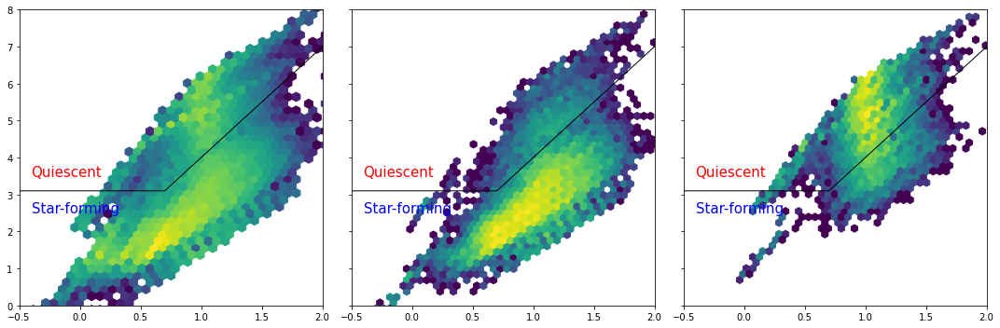

In [35]:
fig, ax = plt.subplots(1,3,figsize=(15,5),sharey='row',sharex='row')
ax[0].hexbin(table['RJ'],table['NUVR'],bins='log',gridsize=50,mincnt=1)
ax[0].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=1,label='Color selection boundary')
ax[0].text(-0.4,3.5,'Quiescent',size=15,color='r')
ax[0].text(-0.4,2.5,'Star-forming',size=15,color='b')
ax[0].set_xlim(-0.5,2)
ax[0].set_ylim(0,8)
ax[1].hexbin(table.loc[np.log10(table['SFR_best']/table['Mstar_best'])>-10.5,'RJ'],
             table.loc[np.log10(table['SFR_best']/table['Mstar_best'])>-10.5,'NUVR'],
             bins='log',gridsize=50,mincnt=1)
ax[1].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=1,label='Color selection boundary')
ax[1].text(-0.4,3.5,'Quiescent',size=15,color='r')
ax[1].text(-0.4,2.5,'Star-forming',size=15,color='b')
ax[2].hexbin(table.loc[np.log10(table['SFR_best']/table['Mstar_best'])<=-10.5,'RJ'],
             table.loc[np.log10(table['SFR_best']/table['Mstar_best'])<=-10.5,'NUVR'],
             bins='log',gridsize=50,mincnt=1)
ax[2].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=1,label='Color selection boundary')
ax[2].text(-0.4,3.5,'Quiescent',size=15,color='r')
ax[2].text(-0.4,2.5,'Star-forming',size=15,color='b')
fig.tight_layout()
plt.show()

## Grouping galaxies by type

Here we can difine criteria to group by galaxy type (i.e. quiescent or star-forming)

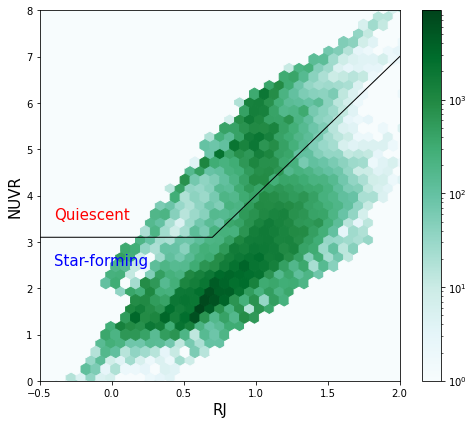

In [66]:
fig, ax = plt.subplots(figsize=(7,6))
ax.set_xlabel('$R - J$',size=15)
ax.set_ylabel('$NUV - R$',size=15)
table.plot.hexbin(x='RJ',y='NUVR',bins='log',ax=ax,gridsize=50)
ax.plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=1,label='Color selection boundary')
ax.text(-0.4,3.5,'Quiescent',size=15,color='r')
ax.text(-0.4,2.5,'Star-forming',size=15,color='b')
ax.set_xlim(-0.5,2)
ax.set_ylim(0,8)
fig.tight_layout()
plt.show()

In [36]:
def galaxy_type(NUVR,RJ):
    if ((NUVR>3.1)&(NUVR>3*RJ+1)):
        return 'QG'
    else:
        return 'SFG'

galaxy_type_v=np.vectorize(galaxy_type)

In [37]:
grouped = table.groupby(galaxy_type_v(table.loc[:,'NUVR'],table.loc[:,'RJ']))
grouped.size()

QG      70084
SFG    271897
dtype: int64

In [69]:
grouped = table.groupby(table.loc[:,'S_Code'])
grouped.size()

S_Code
C        4
M     1622
S    16888
Z      143
dtype: int64

In [70]:
grouped = table.groupby([galaxy_type_v(table.loc[:,'NUVR'],table.loc[:,'RJ']),table.loc[:,'S_Code']])


In [71]:
grouped.size()

     S_Code
QG   C             1
     M           301
     S          1413
     Z            86
SFG  C             3
     M          1321
     S         15475
     Z            57
dtype: int64

<ipython-input-80-b6d35f6e834d>:4: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',gridsize=50,vmax=5000)
<ipython-input-80-b6d35f6e834d>:4: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',gridsize=50,vmax=5000)
<ipython-input-80-b6d35f6e834d>:4: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hex

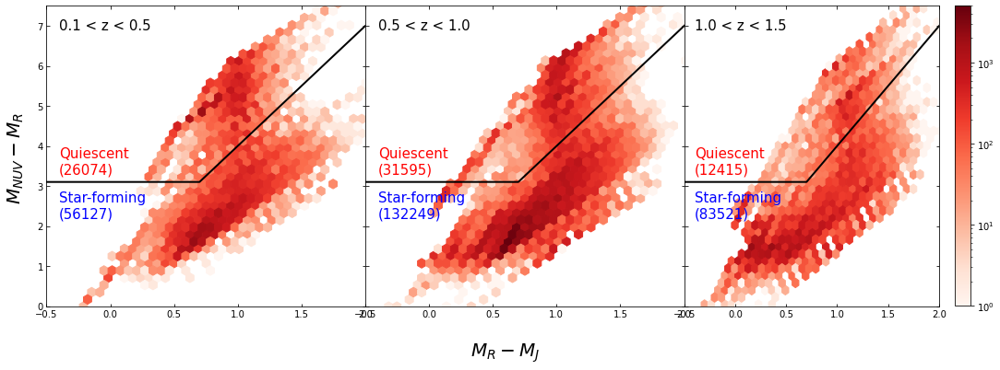

In [80]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    data = table[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',gridsize=50,vmax=5000)
    ax[i].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=2,label='Color selection boundary')
    qg=len(data[(data['NUVR']>3.1)&(data['NUVR']>3*data['RJ']+1)])
    sfg=len(data[(data['NUVR']<=3.1)|(data['NUVR']<=3*data['RJ']+1)])
    ax[i].text(-0.4,6.9,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].text(-0.4,3.3,f'Quiescent\n({qg})',size=15,color='r')
    ax[i].text(-0.4,2.2,f'Star-forming\n({sfg})',size=15,color='b')
    ax[i].set_xlim(-0.5,2)
    ax[i].set_ylim(0,7.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
cb = fig.colorbar(hb)
fig.text(0.5, 0.0,'$M_{R} - M_{J}$', ha='center',fontsize=20)
fig.text(0.0, 0.5,'$M_{NUV} - M_{R}$', va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

<ipython-input-84-ec569c980d9a>:4: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='plasma',bins='log',mincnt=1,gridsize=30,vmax=10000)
<ipython-input-84-ec569c980d9a>:4: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='plasma',bins='log',mincnt=1,gridsize=30,vmax=10000)
<ipython-input-84-ec569c980d9a>:4: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[

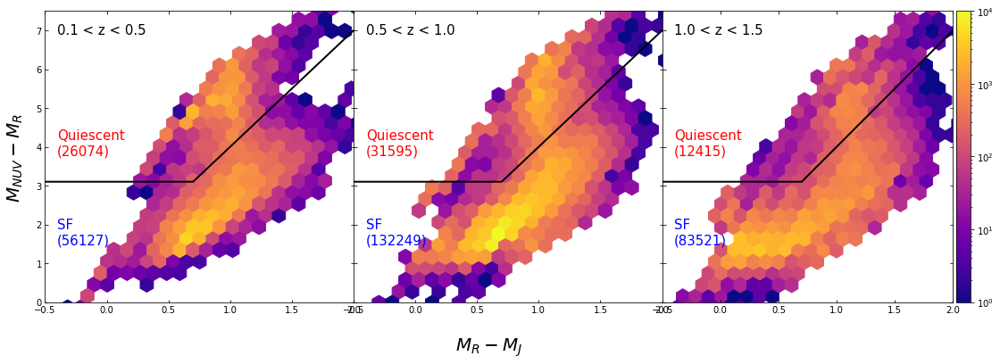

In [84]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    data = table[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='plasma',bins='log',mincnt=1,gridsize=30,vmax=10000)
    ax[i].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=2,label='Color selection boundary')
    qg=len(data[(data['NUVR']>3.1)&(data['NUVR']>3*data['RJ']+1)])
    sfg=len(data[(data['NUVR']<=3.1)|(data['NUVR']<=3*data['RJ']+1)])
    ax[i].text(-0.4,6.9,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].text(-0.4,3.8,f'Quiescent\n({qg})',size=15,color='r')
    ax[i].text(-0.4,1.5,f'SF\n({sfg})',size=15,color='b')
    ax[i].set_xlim(-0.5,2)
    ax[i].set_ylim(0,7.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(hb, cax=cax)
#cb = fig.colorbar(hb)
fig.text(0.5, 0.0,'$M_{R} - M_{J}$', ha='center',fontsize=20)
fig.text(0.0, 0.5,'$M_{NUV} - M_{R}$', va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

In [85]:
def H_detection(flux,flux_l,flux_u):
    if (flux>5*(flux_u-flux)) & (flux>5*(flux-flux_l)):
        return 1
    else:
        return 0

H_detection_v = np.vectorize(H_detection)

In [86]:
table['H_detections'] = np.zeros(len(table))

table['H_detections'] = table['H_detections'] + H_detection_v(table['F_PACS_100_1'],table['FErr_PACS_100_l_1'],table['FErr_PACS_100_u_1'])
table['H_detections'] = table['H_detections'] + H_detection_v(table['F_PACS_160_1'],table['FErr_PACS_160_l_1'],table['FErr_PACS_160_u_1'])
table['H_detections'] = table['H_detections'] + H_detection_v(table['F_SPIRE_250_1'],table['FErr_SPIRE_250_l_1'],table['FErr_SPIRE_250_u_1'])
table['H_detections'] = table['H_detections'] + H_detection_v(table['F_SPIRE_350_1'],table['FErr_SPIRE_350_l_1'],table['FErr_SPIRE_350_u_1'])
table['H_detections'] = table['H_detections'] + H_detection_v(table['F_SPIRE_500_1'],table['FErr_SPIRE_500_l_1'],table['FErr_SPIRE_500_u_1'])

In [87]:
print(np.count_nonzero(table['H_detections']))
print(np.count_nonzero(table['H_detections']>1))

11964
4021


<ipython-input-104-9e7668bf037b>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',bins='log',mincnt=1,vmax=5000,gridsize=50)
<ipython-input-104-9e7668bf037b>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',bins='log',mincnt=1,vmax=5000,gridsize=50)
<ipython-input-104-9e7668bf037b>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].

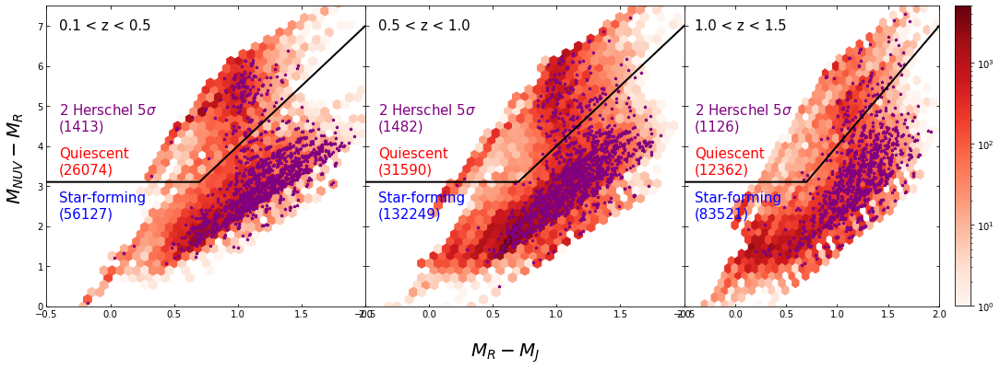

In [104]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    data = table.loc[(table['z']>z1)&(table['z']<=z2)]
    irb_data = table.loc[(table['z']>z1)&(table['z']<=z2)&(table['H_detections']>1)] #grouped.get_group('IRBQG').loc[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',bins='log',mincnt=1,vmax=5000,gridsize=50)
    ax[i].scatter(irb_data.loc[:,'RJ'],irb_data.loc[:,'NUVR'],color='purple',marker='*',s=10)
    ax[i].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=2,label='Color selection boundary')
    qg=len(grouped.get_group('QG').loc[(table['z']>z1)&(table['z']<=z2)])
    sfg=len(grouped.get_group('SFG').loc[(table['z']>z1)&(table['z']<=z2)])
    ax[i].text(-0.4,6.9,f'{z1} < z < {z2}',size=15,color='k')
    if len(irb_data)!=0:
        ax[i].text(-0.4,4.4,f'2 Herschel 5$\sigma$\n({len(irb_data)})',size=15,color='purple')
    ax[i].text(-0.4,3.3,f'Quiescent\n({qg})',size=15,color='r')
    ax[i].text(-0.4,2.2,f'Star-forming\n({sfg})',size=15,color='b')
    ax[i].set_xlim(-0.5,2)
    ax[i].set_ylim(0,7.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
cb = fig.colorbar(hb)
fig.text(0.5, 0.0,'$M_{R} - M_{J}$', ha='center',fontsize=20)
fig.text(0.0, 0.5,'$M_{NUV} - M_{R}$', va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

<ipython-input-105-7321681ba75f>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
<ipython-input-105-7321681ba75f>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
<ipython-input-105-7321681ba75f>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].

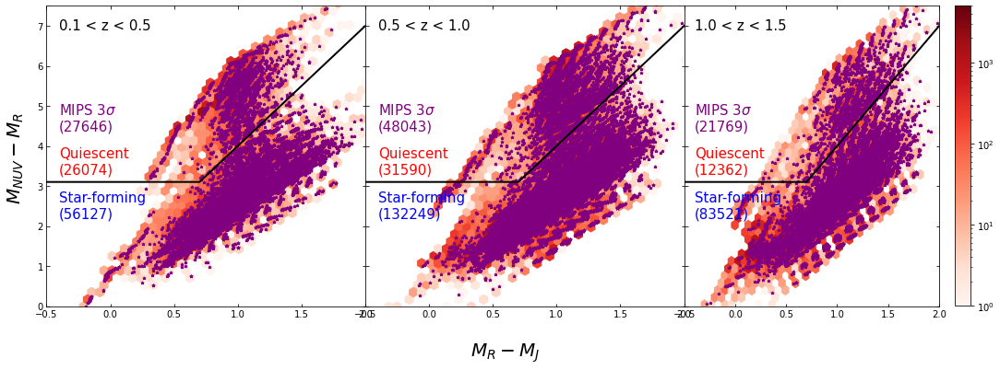

In [105]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    data = table.loc[(table['z']>z1)&(table['z']<=z2)]
    irb_data = table.query(MIPSSNR3).loc[(table['z']>z1)&(table['z']<=z2)] #grouped.get_group('IRBQG').loc[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
    ax[i].scatter(irb_data.loc[:,'RJ'],irb_data.loc[:,'NUVR'],color='purple',marker='*',s=10)
    ax[i].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=2,label='Color selection boundary')
    qg=len(grouped.get_group('QG').loc[(table['z']>z1)&(table['z']<=z2)])
    sfg=len(grouped.get_group('SFG').loc[(table['z']>z1)&(table['z']<=z2)])
    ax[i].text(-0.4,6.9,f'{z1} < z < {z2}',size=15,color='k')
    if len(irb_data)!=0:
        ax[i].text(-0.4,4.4,f'MIPS 3$\sigma$\n({len(irb_data)})',size=15,color='purple')
    ax[i].text(-0.4,3.3,f'Quiescent\n({qg})',size=15,color='r')
    ax[i].text(-0.4,2.2,f'Star-forming\n({sfg})',size=15,color='b')
    ax[i].set_xlim(-0.5,2)
    ax[i].set_ylim(0,7.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
cb = fig.colorbar(hb)
fig.text(0.5, 0.0,'$M_{R} - M_{J}$', ha='center',fontsize=20)
fig.text(0.0, 0.5,'$M_{NUV} - M_{R}$', va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

In [6]:
m = np.arange(7,12.4,0.2)

def SchreiberMS(m1,z): ## For plotting Schreiber+15 main sequence
    return m1-9 - 0.5 + (1.5*np.log10(1+z)) - 0.3*(np.fmax(m1-9 - 0.36-2.5*np.log10(1+z),0.))**2

def SpeagleMS(m1,z): ## For plotting Speagle+14 main sequence:
    age = cosmo.age(z).value
    return (0.84-0.026*age)*m1-6.51+0.11*age

def CarnallQ(m1,z): ## For plotting Carnall+20 sSFR quiescent limit:
    age = cosmo.age(z).value
    return m1+np.log10(0.2/age)-9

We can plot SFR vs stellar mass for the galaxies in our sample. In the following plts I have included the Star Forming Main Sequence as specified by Shreiber 2015, and the quiescent upper sSFR limit from Carnall 2020, both for redshift 0.55.The line indicating log(sSFR) = -11, the upper limit used by Ilbert 2013 for quiescent galaxies, is also shown.

<ipython-input-39-549fdb4188b5>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(SF).loc[:,'Mass_median_2'],
<ipython-input-39-549fdb4188b5>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(SF).loc[:,'Mass_median_2'],
<ipython-input-39-549fdb4188b5>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(SF).loc[:,'Mass_median_2'],


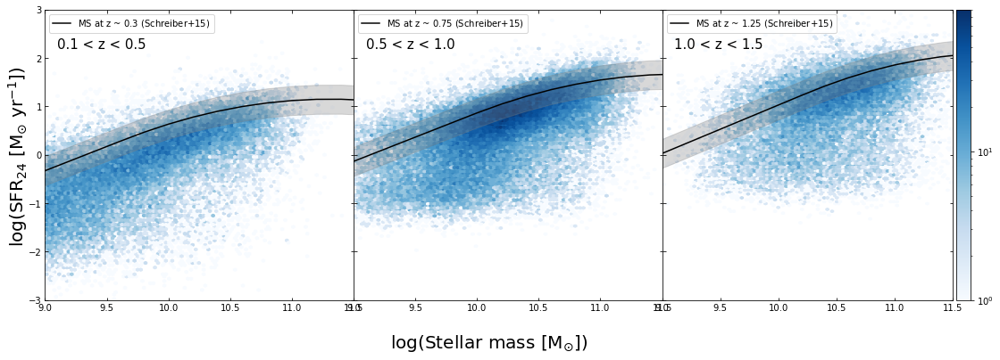

In [39]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.query(SF).loc[:,'Mass_median_2'],
                       np.log10(data.query(SF).loc[:,'SFR_24']),
                       cmap='Blues',mincnt=1,bins='log',vmax=90)
    #cb = fig.colorbar(hb)
    ax[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.5)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(hb, cax=cax)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{24}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

<ipython-input-40-d47d236cb6ad>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(SF).loc[:,'Mass_median_2'],
<ipython-input-40-d47d236cb6ad>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(SF).loc[:,'Mass_median_2'],
<ipython-input-40-d47d236cb6ad>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(SF).loc[:,'Mass_median_2'],


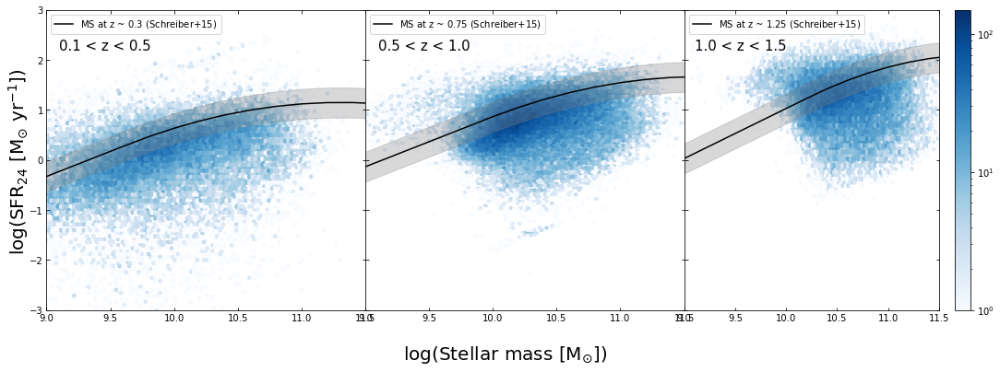

In [40]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.query(SF).loc[:,'Mass_median_2'],
                       np.log10(data.query(SF).loc[:,'SFR_best']),
                       cmap='Blues',mincnt=1,bins='log',vmax=150)
    #cb = fig.colorbar(hb)
    ax[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.5)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
cb = fig.colorbar(hb)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{24}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

<ipython-input-41-2c2fe6e88cf9>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(quiescent).loc[:,'Mass_median_2'],
<ipython-input-41-2c2fe6e88cf9>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(quiescent).loc[:,'Mass_median_2'],
<ipython-input-41-2c2fe6e88cf9>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(quiescent).loc[:,'Mass_median_2'],


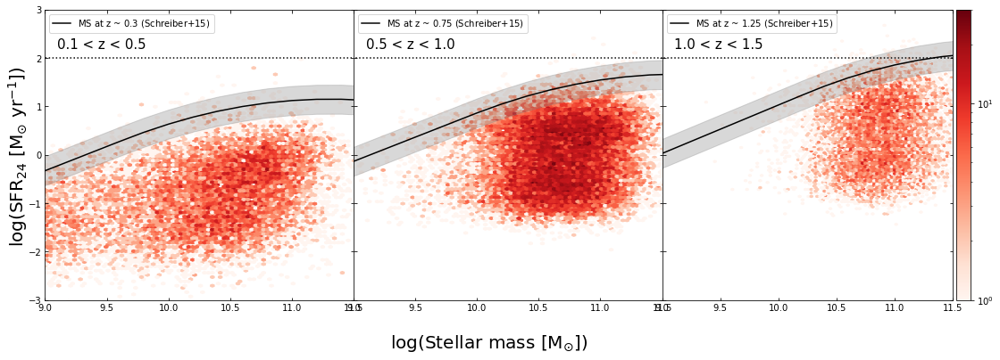

In [41]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.query(quiescent).loc[:,'Mass_median_2'],
                       np.log10(data.query(quiescent).loc[:,'SFR_24']),
                       cmap='Reds',mincnt=1,bins='log',vmax=30)
    #cb = fig.colorbar(hb, ax=ax[i])
    ax[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.5)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
    ax[i].plot([7,11.5],[2,2],ls=':',color='k')
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(hb, cax=cax)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{24}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

<ipython-input-42-75da77f84d58>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(quiescent).loc[:,'Mass_median_2'],
<ipython-input-42-75da77f84d58>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(quiescent).loc[:,'Mass_median_2'],
<ipython-input-42-75da77f84d58>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.query(quiescent).loc[:,'Mass_median_2'],


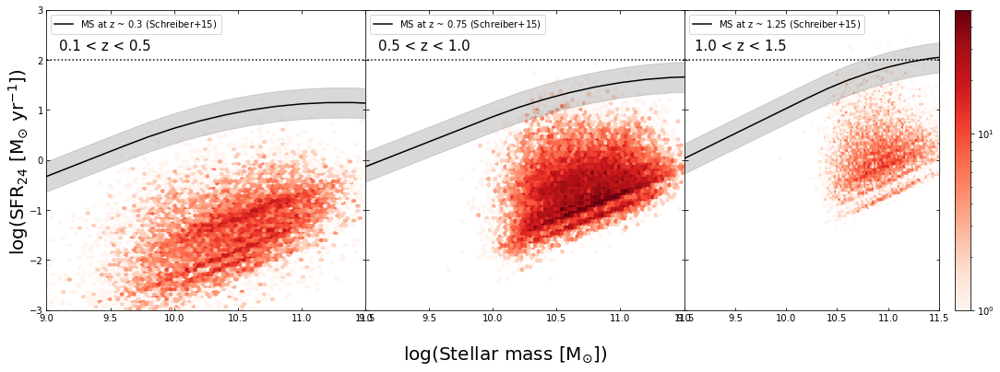

In [42]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = table[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.query(quiescent).loc[:,'Mass_median_2'],
                       np.log10(data.query(quiescent).loc[:,'SFR_best']),
                       cmap='Reds',mincnt=1,bins='log',vmax=50)
    #cb = fig.colorbar(hb, ax=ax[i])
    ax[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.5)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
    ax[i].plot([7,11.5],[2,2],ls=':',color='k')
cb = fig.colorbar(hb)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{24}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

In [43]:
def galaxy_type_new(NUVR,RJ,SFR):
    if ((NUVR>3.1)&(NUVR>3*RJ+1)):
        if SFR>100:
            return 'IRBQG'
        else:
            return 'QG'
    else:
        return 'SFG'

galaxy_type_new_v=np.vectorize(galaxy_type_new)

In [34]:
grouped = table.groupby(galaxy_type_new_v(table.loc[:,'NUVR'],table.loc[:,'RJ'],table.loc[:,'SFR_24']))
grouped.size()

IRBQG        58
QG        70026
SFG      271897
dtype: int64

<ipython-input-102-1e4f810a67d7>:6: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'Mass_median_2'],np.log10(data.loc[:,'SFR_24']),cmap='Reds',mincnt=1,bins='log',vmax=30)
<ipython-input-102-1e4f810a67d7>:6: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'Mass_median_2'],np.log10(data.loc[:,'SFR_24']),cmap='Reds',mincnt=1,bins='log',vmax=30)
<ipython-input-102-1e4f810a67d7>:6: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating

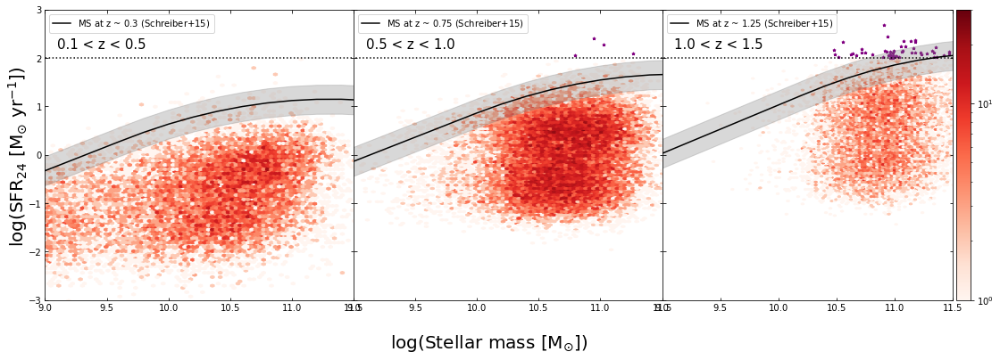

In [102]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = grouped.get_group('QG').loc[(table['z']>z1)&(table['z']<=z2)]
    irb_data = grouped.get_group('IRBQG').loc[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'Mass_median_2'],np.log10(data.loc[:,'SFR_24']),cmap='Reds',mincnt=1,bins='log',vmax=30)
    #cb = fig.colorbar(hb, ax=ax[i])
    ax[i].scatter(irb_data.loc[:,'Mass_median_2'],np.log10(irb_data.loc[:,'SFR_24']),color='purple',marker='*',s=10)
    ax[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.5)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
    ax[i].plot([7,11.5],[2,2],ls=':',color='k')
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(hb, cax=cax)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{24}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

<ipython-input-106-d28d5550fc33>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
<ipython-input-106-d28d5550fc33>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
<ipython-input-106-d28d5550fc33>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].

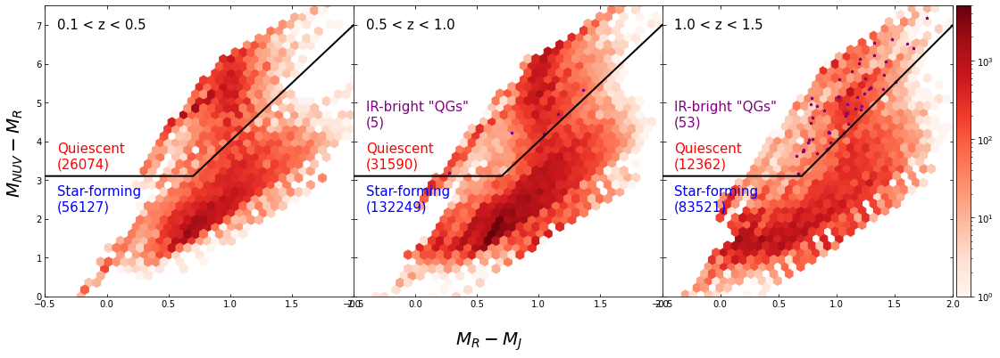

In [106]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    data = table.loc[(table['z']>z1)&(table['z']<=z2)]
    irb_data = grouped.get_group('IRBQG').loc[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
    ax[i].scatter(irb_data.loc[:,'RJ'],irb_data.loc[:,'NUVR'],color='purple',marker='*',s=10)
    ax[i].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=2,label='Color selection boundary')
    qg=len(grouped.get_group('QG').loc[(table['z']>z1)&(table['z']<=z2)])
    sfg=len(grouped.get_group('SFG').loc[(table['z']>z1)&(table['z']<=z2)])
    ax[i].text(-0.4,6.9,f'{z1} < z < {z2}',size=15,color='k')
    if len(irb_data)!=0:
        ax[i].text(-0.4,4.4,f'IR-bright "QGs"\n({len(irb_data)})',size=15,color='purple')
    ax[i].text(-0.4,3.3,f'Quiescent\n({qg})',size=15,color='r')
    ax[i].text(-0.4,2.2,f'Star-forming\n({sfg})',size=15,color='b')
    ax[i].set_xlim(-0.5,2)
    ax[i].set_ylim(0,7.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(hb, cax=cax)
fig.text(0.5, 0.0,'$M_{R} - M_{J}$', ha='center',fontsize=20)
fig.text(0.0, 0.5,'$M_{NUV} - M_{R}$', va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

In [44]:
def galaxy_type_new(NUVR,RJ,SFR,mass,redshift):
    if ((NUVR>3.1)&(NUVR>3*RJ+1)):
        if np.log10(SFR)>SchreiberMS(mass,redshift):#+0.3:
            return 'IRBQG'
        else:
            return 'QG'
    else:
        return 'SFG'

galaxy_type_new_v=np.vectorize(galaxy_type_new)

In [45]:
grouped = table.groupby(galaxy_type_new_v(table.loc[:,'NUVR'],table.loc[:,'RJ'],table.loc[:,'SFR_24'],table.loc[:,'Mass_median_2'],table.loc[:,'z']))
grouped.size()

IRBQG       645
QG        69439
SFG      271897
dtype: int64

<ipython-input-109-1e4f810a67d7>:6: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'Mass_median_2'],np.log10(data.loc[:,'SFR_24']),cmap='Reds',mincnt=1,bins='log',vmax=30)
<ipython-input-109-1e4f810a67d7>:6: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'Mass_median_2'],np.log10(data.loc[:,'SFR_24']),cmap='Reds',mincnt=1,bins='log',vmax=30)
<ipython-input-109-1e4f810a67d7>:6: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating

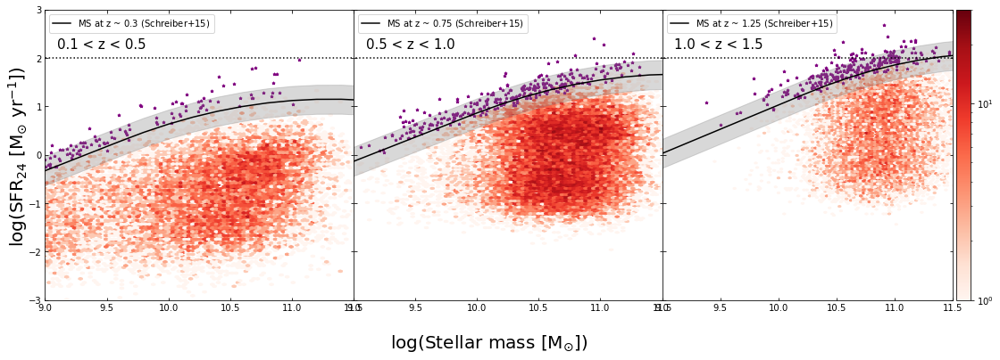

In [109]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    z = (z1+z2)/2
    data = grouped.get_group('QG').loc[(table['z']>z1)&(table['z']<=z2)]
    irb_data = grouped.get_group('IRBQG').loc[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'Mass_median_2'],np.log10(data.loc[:,'SFR_24']),cmap='Reds',mincnt=1,bins='log',vmax=30)
    #cb = fig.colorbar(hb, ax=ax[i])
    ax[i].scatter(irb_data.loc[:,'Mass_median_2'],np.log10(irb_data.loc[:,'SFR_24']),color='purple',marker='*',s=10)
    ax[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    ax[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.3,color='grey')
    ax[i].text(9.1,2.2,f'{z1} < z < {z2}',size=15,color='k')
    ax[i].set_xlim(9,11.5)
    ax[i].set_ylim(-3,3)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
    ax[i].legend(loc='upper left')
    ax[i].plot([7,11.5],[2,2],ls=':',color='k')
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(hb, cax=cax)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=20)
fig.text(0.0, 0.5,"log(SFR$_{24}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

<ipython-input-111-d28d5550fc33>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
<ipython-input-111-d28d5550fc33>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
<ipython-input-111-d28d5550fc33>:5: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  hb = ax[i].

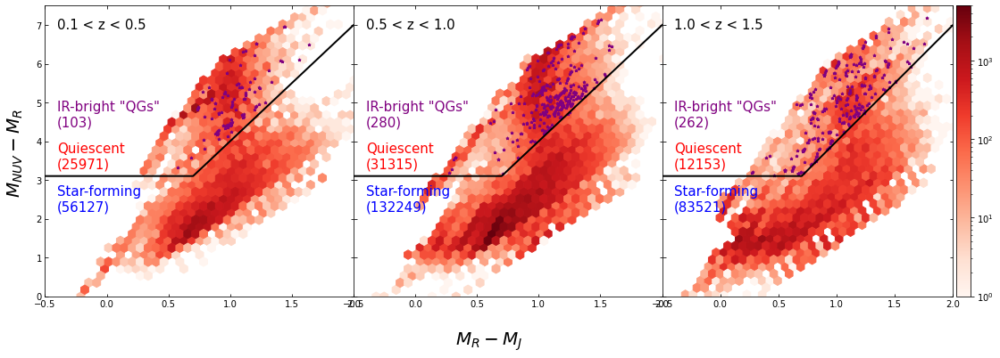

In [111]:
fig, ax = plt.subplots(1,3,figsize=(15,6),sharey='row')
for i, z1, z2 in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5]):
    data = table.loc[(table['z']>z1)&(table['z']<=z2)]
    irb_data = grouped.get_group('IRBQG').loc[(table['z']>z1)&(table['z']<=z2)]
    hb = ax[i].hexbin(data.loc[:,'RJ'],data.loc[:,'NUVR'],cmap='Reds',mincnt=1,bins='log',vmax=5000,gridsize=50)
    ax[i].scatter(irb_data.loc[:,'RJ'],irb_data.loc[:,'NUVR'],color='purple',marker='*',s=10)
    ax[i].plot([-1,0.7,3],[3.1,3.1,10],color='k',linewidth=2,label='Color selection boundary')
    qg=len(grouped.get_group('QG').loc[(table['z']>z1)&(table['z']<=z2)])
    sfg=len(grouped.get_group('SFG').loc[(table['z']>z1)&(table['z']<=z2)])
    ax[i].text(-0.4,6.9,f'{z1} < z < {z2}',size=15,color='k')
    if len(irb_data)!=0:
        ax[i].text(-0.4,4.4,f'IR-bright "QGs"\n({len(irb_data)})',size=15,color='purple')
    ax[i].text(-0.4,3.3,f'Quiescent\n({qg})',size=15,color='r')
    ax[i].text(-0.4,2.2,f'Star-forming\n({sfg})',size=15,color='b')
    ax[i].set_xlim(-0.5,2)
    ax[i].set_ylim(0,7.5)
    ax[i].tick_params(which='both',top=True,right=True,direction='in')
divider = make_axes_locatable(ax[2])
cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(hb, cax=cax)
fig.text(0.5, 0.0,'$M_{R} - M_{J}$', ha='center',fontsize=20)
fig.text(0.0, 0.5,'$M_{NUV} - M_{R}$', va='center',fontsize=20, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
#fig.tight_layout()
plt.show()

### This is to find the sources that are detected in both IR and radio:

In [49]:
table['IRRadio'] = table['Peak_flux']+table['F_PACS_100_1']
print(len(table.loc[~np.isnan(table['IRRadio'])]))
print(len(grouped.get_group('QG').loc[~np.isnan(table['IRRadio'])]))
print(len(grouped.get_group('SFG').loc[~np.isnan(table['IRRadio'])]))

16507
1172
15221


## Grouping galaxies by type, redshift and stellar mass

Here we can difine criteria to group by galaxy type (i.e. quiescent or star-forming) and in different redshift and stellar mass bins.

In [46]:
def create_bins(number,bin_width=1):
    q = np.floor(number/bin_width)
    return q*bin_width

In [47]:
mass_binwidth = 0.25
z_binwidth = 0.5

In [50]:
grouped_1 = table.groupby([galaxy_type_new_v(table.loc[:,'NUVR'],table.loc[:,'RJ'],table['SFR_24'],table.loc[:,'Mass_median_2'],table.loc[:,'z']),create_bins(table.loc[:,'z'],z_binwidth),create_bins(table.loc[:,'Mass_median_2'],mass_binwidth)])
grouped_1.size()

       z    Mass_median_2
IRBQG  0.0  9.00               23
            9.25               18
            9.50               13
            9.75                7
            10.00              14
                             ... 
SFG    1.0  10.50            8100
            10.75            6293
            11.00            2840
            11.25             602
            11.50              56
Length: 110, dtype: int64

In [51]:
grouped_1.groups.keys()

dict_keys([('IRBQG', 0.0, 9.0), ('IRBQG', 0.0, 9.25), ('IRBQG', 0.0, 9.5), ('IRBQG', 0.0, 9.75), ('IRBQG', 0.0, 10.0), ('IRBQG', 0.0, 10.25), ('IRBQG', 0.0, 10.5), ('IRBQG', 0.0, 10.75), ('IRBQG', 0.0, 11.0), ('IRBQG', 0.5, 9.0), ('IRBQG', 0.5, 9.25), ('IRBQG', 0.5, 9.5), ('IRBQG', 0.5, 9.75), ('IRBQG', 0.5, 10.0), ('IRBQG', 0.5, 10.25), ('IRBQG', 0.5, 10.5), ('IRBQG', 0.5, 10.75), ('IRBQG', 0.5, 11.0), ('IRBQG', 0.5, 11.25), ('IRBQG', 0.5, 12.0), ('IRBQG', 1.0, 9.25), ('IRBQG', 1.0, 9.5), ('IRBQG', 1.0, 9.75), ('IRBQG', 1.0, 10.0), ('IRBQG', 1.0, 10.25), ('IRBQG', 1.0, 10.5), ('IRBQG', 1.0, 10.75), ('IRBQG', 1.0, 11.0), ('IRBQG', 1.0, 11.25), ('IRBQG', 1.0, 11.5), ('QG', 0.0, 9.0), ('QG', 0.0, 9.25), ('QG', 0.0, 9.5), ('QG', 0.0, 9.75), ('QG', 0.0, 10.0), ('QG', 0.0, 10.25), ('QG', 0.0, 10.5), ('QG', 0.0, 10.75), ('QG', 0.0, 11.0), ('QG', 0.0, 11.25), ('QG', 0.0, 11.5), ('QG', 0.0, 11.75), ('QG', 0.0, 12.0), ('QG', 0.0, 12.25), ('QG', 0.0, 12.5), ('QG', 0.0, 12.75), ('QG', 0.0, 13.0),

In [50]:
table_2 = table.copy()
table_2 = table_2[np.isnan(table_2['Peak_flux'])]

In [51]:
grouped_2 = table_2.groupby([galaxy_type_new_v(table_2.loc[:,'NUVR'],table_2.loc[:,'RJ'],table_2['SFR_24'],table_2.loc[:,'Mass_median_2'],table_2.loc[:,'z']),create_bins(table_2.loc[:,'z'],z_binwidth),create_bins(table_2.loc[:,'Mass_median_2'],mass_binwidth)])
grouped_2.size()

       z    Mass_median_2
IRBQG  0.0  9.00               23
            9.25               18
            9.50               13
            9.75                5
            10.00              10
                             ... 
SFG    1.0  10.50            7213
            10.75            4895
            11.00            1787
            11.25             364
            11.50              28
Length: 107, dtype: int64

In [166]:
grouped.get_group('QG').loc[~np.isnan(table['IRRadio'])].index

Int64Index([ 42322,  59532,  60729,  68824,  69341,  69854,  73927,  74015,
             74718,  75145,
            ...
            817657, 818130, 818321, 818459, 822714, 825376, 825537, 828269,
            830685, 831071],
           dtype='int64', length=787)

## Extracting fluxes from stacked image cutouts

In [52]:
### Packages for aperture photometry
from photutils import CircularAperture
from photutils import aperture_photometry
from astropy.stats import bootstrap

### Get fluxes from stacked cutouts and their uncertainties from bootstrap samples, and write them on a table

In [54]:
def get_flux_and_unc(group_name,image_data,W,pixscale,FWHM,unit):
    ''' Create cutouts of the sources listed in group_name, taken from the map in image_data using
        the world coordinate system W. Stack images to get the median value in each pixel. Extract
        the flux from stack performing aperture photometry with a radius equal to FWHM, converted 
        from arcsec into pixels with pixscale.
        Returns flux and error in mJy
    '''
    cutout_list=[]
    for ra,dec in zip(grouped_1.get_group(group_name).loc[:,'RA_1'],grouped_1.get_group(group_name).loc[:,'DEC_1']):
        world_coords = [ra,dec]
        pixel_coords = W.all_world2pix([world_coords], 0)
        position = (pixel_coords[0][0],pixel_coords[0][1])
        size = (FWHM*2/pixscale+2, FWHM*2/pixscale+2) # twice the fwhm plus 2 pixels
        cutout = Cutout2D(image_data, position, size,mode='partial') # no trimming of cutouts
        cutout_list.append(cutout.data)
    
    cutout_list = np.array(cutout_list)
    #print(cutout_list.shape)
    boot_arr = bootstrap(np.arange(len(cutout_list)),bootnum=100).astype(int)
    #print(boot_arr.shape)

    median_list=[]
    for n in boot_arr:
        stack = cutout_list[n]
        stack = np.median(stack,axis=0)
        side = stack.shape[0]/2
                                    # aperture center position in pixel coordinates
        aperture = CircularAperture((side-0.5,side-0.5),r=FWHM/pixscale)
        phot_table = aperture_photometry(stack, aperture)
        median_list.append(phot_table['aperture_sum'][0])
        
    if unit=='Jy/pix':
        median_flux = np.mean(median_list)
        std_flux = np.std(median_list)
    elif unit=='Jy/beam':
        pixarea = pixscale**2 # pixel area in arcsec^2/pixel
        beamarea = np.pi*((FWHM**2)/(4*np.log(2))) # beam area in arcsec^2/beam
        median_flux = np.mean(median_list)*pixarea/beamarea # converting to Jy/pixel
        std_flux = np.std(median_list)*pixarea/beamarea
    print(group_name,len(cutout_list))
    
    return median_flux*1000, std_flux*1000 # from Jy to mJy

In [45]:
def get_flux_and_unc_2(group_name,image_data,W,pixscale,FWHM,unit):
    ''' Create cutouts of the sources listed in group_name, taken from the map in image_data using
        the world coordinate system W. Stack images to get the median value in each pixel. Extract
        the flux from stack performing aperture photometry with a radius equal to FWHM, converted 
        from arcsec into pixels with pixscale.
        Returns flux and error in mJy
    '''
    cutout_list=[]
    for ra,dec in zip(grouped_2.get_group(group_name).loc[:,'RA_1'],grouped_2.get_group(group_name).loc[:,'DEC_1']):
        world_coords = [ra,dec]
        pixel_coords = W.all_world2pix([world_coords], 0)
        position = (pixel_coords[0][0],pixel_coords[0][1])
        size = (FWHM*2/pixscale+2, FWHM*2/pixscale+2) # twice the fwhm plus 2 pixels
        cutout = Cutout2D(image_data, position, size,mode='partial') # no trimming of cutouts
        cutout_list.append(cutout.data)
    
    cutout_list = np.array(cutout_list)
    #print(cutout_list.shape)
    boot_arr = bootstrap(np.arange(len(cutout_list)),bootnum=100).astype(int)
    #print(boot_arr.shape)

    median_list=[]
    for n in boot_arr:
        stack = cutout_list[n]
        stack = np.median(stack,axis=0)
        side = stack.shape[0]/2
                                    # aperture center position in pixel coordinates
        aperture = CircularAperture((side-0.5,side-0.5),r=FWHM/pixscale)
        phot_table = aperture_photometry(stack, aperture)
        median_list.append(phot_table['aperture_sum'][0])
        
    if unit=='Jy/pix':
        median_flux = np.mean(median_list)
        std_flux = np.std(median_list)
    elif unit=='Jy/beam':
        pixarea = pixscale**2 # pixel area in arcsec^2/pixel
        beamarea = np.pi*((FWHM**2)/(4*np.log(2))) # beam area in arcsec^2/beam
        median_flux = np.mean(median_list)*pixarea/beamarea # converting to Jy/pixel
        std_flux = np.std(median_list)*pixarea/beamarea
    print(group_name,len(cutout_list))
    
    return median_flux*1000, std_flux*1000 # from Jy to mJy

In [57]:
def get_flux(group_name,image_data,W,pixscale,FWHM,unit):
    ''' Create cutouts of the sources listed in group_name, taken from the map in image_data using
        the world coordinate system W. Stack images to get the median value in each pixel. Extract
        the flux from stack performing aperture photometry with a radius equal to FWHM, converted 
        from arcsec into pixels with pixscale.
        Returns flux and error in mJy
    '''
    group = grouped_1.get_group(group_name)
    cutout_list=[]
    for ra,dec in zip(group.loc[:,'RA_1'],group.loc[:,'DEC_1']):
        world_coords = [ra,dec]
        pixel_coords = W.all_world2pix([world_coords], 0)
        position = (pixel_coords[0][0],pixel_coords[0][1])
        size = (FWHM*2/pixscale+2, FWHM*2/pixscale+2) # twice the fwhm plus 2 pixels
        cutout = Cutout2D(image_data, position, size,mode='partial') # no trimming of cutouts
        cutout_list.append(cutout.data)
    
    cutout_list = np.array(cutout_list)

    stack = np.median(cutout_list,axis=0)
    side = stack.shape[0]/2
                                    # aperture center position in pixel coordinates
    aperture = CircularAperture((side-0.5,side-0.5),r=FWHM/pixscale)
    phot_table = aperture_photometry(stack, aperture)
    #median_list.append(phot_table['aperture_sum'][0])
        
    if unit=='Jy/pix':
        median_flux = phot_table['aperture_sum'][0]
    elif unit=='Jy/beam':
        pixarea = pixscale**2 # pixel area in arcsec^2/pixel
        beamarea = np.pi*((FWHM**2)/(4*np.log(2))) # beam area in arcsec^2/beam
        median_flux = (phot_table['aperture_sum'][0])*pixarea/beamarea # converting to Jy/pixel
    elif unit=='MJy/sr':
        pixarea = pixscale**2 # pixel area in arcsec^2/pixel
        srarea = 4.25*10**10 # 1 sr area in arcsec^2/sr
        median_flux = (phot_table['aperture_sum'][0])*(10**6)*pixarea/srarea # converting to Jy/pixel        
    else: print('unspecified map unit')
    print(group_name,len(cutout_list))
    del group
    
    return median_flux*1000 # from Jy to mJy

In [55]:
get_flux_and_unc(('SFG', 0.0, 10.0),imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit=unit_lofar)

('SFG', 0.0, 10.0) 5056


(0.0547599191090307, 0.0011051551948245727)

In [58]:
get_flux(('SFG', 0.0, 10.0),imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit=unit_lofar)

('SFG', 0.0, 10.0) 5056


0.05474498915041841

In [59]:
grouped_1.get_group(('QG', 1.0, 10.0)).median()['SFR_best']

2.0423

In [60]:
# Create table with fluxes
time_start = time()
results_table = pd.DataFrame({})
for name in grouped_1.groups.keys():
    
    flux_lofar = get_flux(name,imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit=unit_lofar)
    flux_100 = get_flux(name,imdata_100,w_100,pixscale_100,FWHM=fwhm_100,unit=unit_100)
    flux_160 = get_flux(name,imdata_160,w_160,pixscale_160,FWHM=fwhm_160,unit=unit_160)
    flux_250 = get_flux(name,imdata_250,w_250,pixscale_250,FWHM=fwhm_250,unit=unit_250)
    flux_350 = get_flux(name,imdata_350,w_350,pixscale_350,FWHM=fwhm_350,unit=unit_350)
    flux_500 = get_flux(name,imdata_500,w_500,pixscale_500,FWHM=fwhm_500,unit=unit_500)
        
    results_table = results_table.append(pd.DataFrame({"Type":[name[0]],
                                                       "Detections":[True],
                                                       "Redshift_range":[f'{name[1]} - {name[1]+z_binwidth}'],
                                                       "Median_redshift":[grouped_1.get_group(name).median()['z']],
                                                       "Mass_range":[f'{name[2]} - {name[2]+mass_binwidth}'],
                                                       "Median_mass":[grouped_1.get_group(name).median()['Mass_median_2']],
                                                       "Count":[len(grouped_1.get_group(name))],#}),ignore_index=True)
                                                       "IR_detected":[grouped_1.get_group(name).count().loc['F_PACS_100_1']],
                                                       "Radio_detected":[grouped_1.get_group(name).count().loc['Peak_flux']],
                                                       "IRRadio_detected":[grouped_1.get_group(name).count().loc['IRRadio']],
                                                       "Median_SFR":[grouped_1.get_group(name).median()['SFR_best']],
                                                       "LOFAR_flux(mJy)":[flux_lofar],
                                                       "100_flux(mJy)":[flux_100],
                                                       "160_flux(mJy)":[flux_160],
                                                       "250_flux(mJy)":[flux_250],
                                                       "350_flux(mJy)":[flux_350],
                                                       "500_flux(mJy)":[flux_500]}),ignore_index=True)

time_end = time()
print()
print(time_end-time_start)

('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 

('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 11.0) 2446
('QG', 1.0, 11.0) 2446
('QG', 1.0, 11.0) 2446
('QG', 1.0, 11.0) 2446
('QG', 1.0, 11.0) 2446
('QG', 1.0, 

In [61]:
results_table.to_csv(path+'Results/results_stacked_trial_'+field+'_'+strftime("%Y-%m-%d",localtime())+'.csv',index=False)

In [7]:
results_table = pd.read_csv(path+'Results/results_stacked_trial_'+field+'_2021-09-10.csv')

In [8]:
def SFR_smith(flux,mass,z):
    ''' Get 150 MHz luminosity and the SFR, according to the
        mass-independant L150-SFR relationship by Smith et al. 2020:
            log10(L150[W Hz^-1]) = 1.058*log10(SFR[Msun/year]) + 22.221
        and mass-dependant L150-SFR relationship by Smith et al. 2020:
            log10(L150[W Hz^-1]) = 0.9*log10(SFR[Msun/year]) + 0.33*log10(M[10^10Msun]) + 22.22
        Also get the total uncertainty in the SFR
        https://arxiv.org/pdf/2011.08196v1.pdf
    '''   
    # Luminosity in W/Hz
    L150 = (10**-29)*flux*4*np.pi*(cosmo.luminosity_distance(z).to(u.meter).value)**2
    #L150_unc = (10**-29)*flux_unc*4*np.pi*(cosmo.luminosity_distance(z).to(u.meter).value)**2
    
    beta=1.058
    #beta_unc=0.007
    logL1=22.221
    #logL1_unc=0.008 
    #log10(L150) = 1.058*log10(SFR) + 22.221
    log10SFR = (np.log10(L150) - logL1)/beta
    SFR = 10**log10SFR
    #SFR_unc2 = ( (L150_unc/L150)**2 + (np.log(SFR)*beta_unc)**2 + (np.log(10)*logL1_unc)**2 )*((SFR/beta)**2)
    
    beta=0.903
    #beta_unc=0.012
    logLc=22.218
    #logLc_unc=0.016
    gamma=0.332
    #gamma_unc=0.037
    #log10(L150) = 0.9*log10(SFR) + 0.33*(M-10) + 22.22
    log10SFR = (np.log10(L150) - gamma*(mass-10) - logLc)/beta
    SFR_M = 10**log10SFR
    #SFR_M_unc2 = ( (L150_unc/L150)**2 + (np.log(SFR_M)*beta_unc)**2 + (np.log(10)*logLc_unc)**2 + (np.log(10)*(10-mass)*gamma_unc)**2 )*((SFR_M/beta)**2)

    return L150, SFR, SFR_M

SFR_smith_v = np.vectorize(SFR_smith)

In [9]:
# SFR from Smith et al. 2021
results_table['L150MHZ_1'], results_table['SFR_smith'], results_table['SFR_smith_M'] = SFR_smith_v(results_table['LOFAR_flux(mJy)'],results_table['Median_mass'],results_table['Median_redshift'])

<ipython-input-8-68be5659c8d9>:19: RuntimeWarning: invalid value encountered in log10
  log10SFR = (np.log10(L150) - logL1)/beta
<ipython-input-8-68be5659c8d9>:30: RuntimeWarning: invalid value encountered in log10
  log10SFR = (np.log10(L150) - gamma*(mass-10) - logLc)/beta


In [10]:
SFR_033 = 10**((np.log10((10**-29)*0.06*4*np.pi*(cosmo.luminosity_distance(0.3).to(u.meter).value)**2) - 22.221)/1.058)
SFR_075 = 10**((np.log10((10**-29)*0.06*4*np.pi*(cosmo.luminosity_distance(0.75).to(u.meter).value)**2) - 22.221)/1.058)
SFR_125 = 10**((np.log10((10**-29)*0.06*4*np.pi*(cosmo.luminosity_distance(1.25).to(u.meter).value)**2) - 22.221)/1.058)

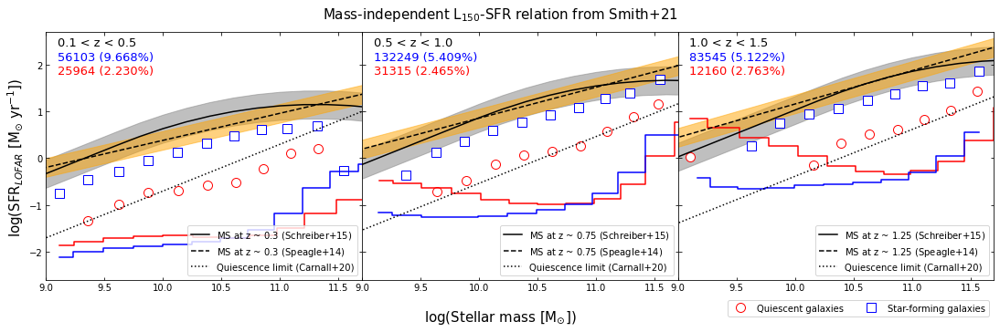

In [11]:
#%% Plotting Star formation rate vs Stellar mass
fig, axs = plt.subplots(1,3,figsize=(15,5), sharey=True)
for i,za,zb,sfrlim in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5],[SFR_033,SFR_075,SFR_125]):
    z = (za+zb)/2
    data = results_table[(results_table['Median_redshift']>za)&(results_table['Median_redshift']<=zb)&(results_table['Detections']==1)]
    axs[i].errorbar(data.loc[(data['Type']=='QG'),'Median_mass'],
                   np.log10(data.loc[(data['Type']=='QG'),'SFR_smith']),
                   #yerr=data.loc[(data['Type']=='QG'),'SFR_smith_unc']/(data.loc[(data['Type']=='QG'),'SFR_smith']*np.log(10)),
                   fmt='o',mfc='w',mec='r',ms=10,ecolor='r',barsabove=True,capsize=2.5,label='_Quiescent galaxies')
    axs[i].errorbar(data.loc[(data['Type']=='SFG'),'Median_mass'],
                   np.log10(data.loc[(data['Type']=='SFG'),'SFR_smith']),
                   #yerr=data.loc[(data['Type']=='SFG'),'SFR_smith_unc']/(data.loc[(data['Type']=='SFG'),'SFR_smith']*np.log(10)),
                   fmt='s',mfc='w',mec='b',ms=10,ecolor='b',barsabove=True,capsize=2.5,label='_Star-forming galaxies')
    axs[i].step(data.loc[(data['Type']=='QG')&(data['Detections']==1),'Median_mass'],
                np.log10(sfrlim/np.sqrt(data.loc[(data['Type']=='QG')&(data['Detections']==1),'Count'])),
                color='r',where='mid')
    axs[i].step(data.loc[(data['Type']=='SFG')&(data['Detections']==1),'Median_mass'],
                np.log10(sfrlim/np.sqrt(data.loc[(data['Type']=='SFG')&(data['Detections']==1),'Count'])),
                color='b',where='mid')
    axs[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    axs[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.5,color='grey')
    axs[i].plot([8,13],[SpeagleMS(8,z),SpeagleMS(13,z)],ls='--',color='k',label=f'MS at z ~ ${z}$ (Speagle+14)')
    axs[i].plot([8,13],[CarnallQ(8,z),CarnallQ(13,z)],ls=':',color='k',label=f'Quiescence limit (Carnall+20)')
    axs[i].fill_between(m,SpeagleMS(m,z)-0.2,SpeagleMS(m,z)+0.2,alpha=0.5,color='orange')
#    axs[i].axhline(np.log10(sfrlim),c='purple')
    SFG, SFGdetec = data.loc[(data['Type']=='SFG')&(data['Detections']==1),['Count','Radio_detected']].sum()
    QG,  QGdetec  = data.loc[(data['Type']=='QG')&(data['Detections']==1), ['Count','Radio_detected']].sum()
    axs[i].text(9.1,2.4,f'{za} < z < {zb}',size=13,color='k')
    axs[i].text(9.1,2.1,f'{SFG} ({SFGdetec/SFG:.3%})',size=13,color='b')
    axs[i].text(9.1,1.8,f'{QG} ({QGdetec/QG:.3%})',size=13,color='r')
    axs[i].set_ylim(ymin=-2.6,ymax=2.7)
    axs[i].set_xlim(xmin=9,xmax=11.7)
    axs[i].tick_params(which='both',top=True,right=True,direction='in')
    axs[i].legend(numpoints=1, loc='lower right')
fig.suptitle('Mass-independent L$_{150}$-SFR relation from Smith+21',fontsize=15,y=0.96)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=15)
fig.text(0.0, 0.5,"log(SFR$_{LOFAR}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=15, rotation='vertical')
marker1=plt.errorbar([],[],fmt='o',mfc='w',mec='r',ms=10,ecolor='r',label='Quiescent galaxies')
marker2=plt.errorbar([],[],fmt='s',mfc='w',mec='b',ms=10,ecolor='b',label='Star-forming galaxies')
fig.legend(handles=[marker1,marker2],numpoints=1, loc='lower right',bbox_to_anchor=(1,0),ncol=2)
fig.subplots_adjust(left=0.04,right=1,wspace=0)
plt.show()

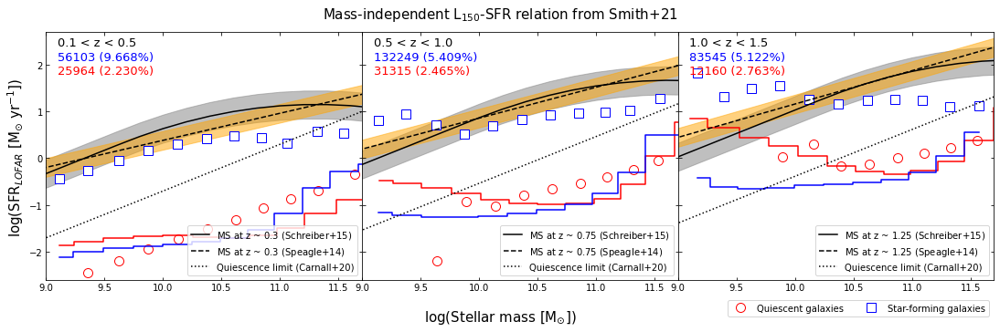

In [12]:
#%% Plotting Star formation rate vs Stellar mass
fig, axs = plt.subplots(1,3,figsize=(15,5), sharey=True)
for i,za,zb,sfrlim in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5],[SFR_033,SFR_075,SFR_125]):
    z = (za+zb)/2
    data = results_table[(results_table['Median_redshift']>za)&(results_table['Median_redshift']<=zb)&(results_table['Detections']==1)]
    axs[i].errorbar(data.loc[(data['Type']=='QG'),'Median_mass'],
                   np.log10(data.loc[(data['Type']=='QG'),'Median_SFR']),
                   fmt='o',mfc='w',mec='r',ms=10,ecolor='r',barsabove=True,capsize=2.5,label='_Quiescent galaxies')
    axs[i].errorbar(data.loc[(data['Type']=='SFG'),'Median_mass'],
                   np.log10(data.loc[(data['Type']=='SFG'),'Median_SFR']),
                   fmt='s',mfc='w',mec='b',ms=10,ecolor='b',barsabove=True,capsize=2.5,label='_Star-forming galaxies')
    axs[i].step(data.loc[(data['Type']=='QG')&(data['Detections']==1),'Median_mass'],
                np.log10(sfrlim/np.sqrt(data.loc[(data['Type']=='QG')&(data['Detections']==1),'Count'])),
                color='r',where='mid')
    axs[i].step(data.loc[(data['Type']=='SFG')&(data['Detections']==1),'Median_mass'],
                np.log10(sfrlim/np.sqrt(data.loc[(data['Type']=='SFG')&(data['Detections']==1),'Count'])),
                color='b',where='mid')
    axs[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    axs[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.5,color='grey')
    axs[i].plot([8,13],[SpeagleMS(8,z),SpeagleMS(13,z)],ls='--',color='k',label=f'MS at z ~ ${z}$ (Speagle+14)')
    axs[i].plot([8,13],[CarnallQ(8,z),CarnallQ(13,z)],ls=':',color='k',label=f'Quiescence limit (Carnall+20)')
    axs[i].fill_between(m,SpeagleMS(m,z)-0.2,SpeagleMS(m,z)+0.2,alpha=0.5,color='orange')
#    axs[i].axhline(np.log10(sfrlim),c='purple')
    SFG, SFGdetec = data.loc[(data['Type']=='SFG')&(data['Detections']==1),['Count','Radio_detected']].sum()
    QG,  QGdetec  = data.loc[(data['Type']=='QG')&(data['Detections']==1), ['Count','Radio_detected']].sum()
    axs[i].text(9.1,2.4,f'{za} < z < {zb}',size=13,color='k')
    axs[i].text(9.1,2.1,f'{SFG} ({SFGdetec/SFG:.3%})',size=13,color='b')
    axs[i].text(9.1,1.8,f'{QG} ({QGdetec/QG:.3%})',size=13,color='r')
    axs[i].set_ylim(ymin=-2.6,ymax=2.7)
    axs[i].set_xlim(xmin=9,xmax=11.7)
    axs[i].tick_params(which='both',top=True,right=True,direction='in')
    axs[i].legend(numpoints=1, loc='lower right')
fig.suptitle('Mass-independent L$_{150}$-SFR relation from Smith+21',fontsize=15,y=0.96)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=15)
fig.text(0.0, 0.5,"log(SFR$_{LOFAR}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=15, rotation='vertical')
marker1=plt.errorbar([],[],fmt='o',mfc='w',mec='r',ms=10,ecolor='r',label='Quiescent galaxies')
marker2=plt.errorbar([],[],fmt='s',mfc='w',mec='b',ms=10,ecolor='b',label='Star-forming galaxies')
fig.legend(handles=[marker1,marker2],numpoints=1, loc='lower right',bbox_to_anchor=(1,0),ncol=2)
fig.subplots_adjust(left=0.04,right=1,wspace=0)
plt.show()

In [13]:
from scipy.optimize import curve_fit
from scipy.optimize import minimize
from scipy.integrate import quad
from astropy import units as u

In [14]:
def GreybodyPL(x,T,Nbb):
    '''Flux density in Jy at wavelength x in micron
    for full IR regime
    given by an optically thick grey-body modelmodified with a MIR power-law
    T is the temperature of the grey body and 
    Nbb is a normalization parameter'''
    alpha = 2.0
    beta = 1.5
    Lc = (26.68 + alpha*6.246)**-2 + (1.905*(10**-4) + alpha*7.243*(10**-5))*T # 1/turnover_wavelength
    Npl = Nbb*((1-np.exp(-(200*Lc)**beta))*(Lc**3))/(np.exp(14387.8*Lc/T)-1)
    flux = Nbb*((1-np.exp(-(200/x)**beta))*(x**-3))/(np.exp(14387.8/(x*T))-1) + Npl*np.exp(-(x*Lc*4/3)**2)*(x*Lc)**alpha
    return flux

In [15]:
def HerschelLIR(z_obj,S1,S2,S3,S4,S5):
    
    dlist=np.array([z_obj,S1,S2,S3,S4,S5])
    if (~np.isfinite(dlist)).any():
        print('Failed nan check')
        return np.nan, np.nan, np.nan
    else:            
        x_data = np.array([100.,160.,250.,350.,500.])
        y_data = np.array([S1,S2,S3,S4,S5])*10**-3 # data in mJy
        try:
            popt, pcov = curve_fit(GreybodyPL,x_data/(1+z_obj),y_data,p0=[30,10**4])
        except RuntimeError:
            print('Failed fit')
            return np.nan, np.nan, np.nan
        dist_factor = 4*np.pi*(cosmo.luminosity_distance(z_obj).to(u.meter).value)**2  # distance is in Mpc
        integral, abserr = quad(lambda x: GreybodyPL(x,popt[0],popt[1])/(x**2),8,1000) # c/lambda^2 factor gives flux density per unit wavelength
        LIR = integral*3*(10**-12)*dist_factor  # 3*(10^8)*(10^-26)*(10^6)
                                                #    c    *   Jy   * 1/micron
        LIR_LSun = LIR/(3.828*10**26)
        print(z_obj,np.log10(LIR_LSun))
    
        return popt[0], popt[1], np.log10(LIR_LSun)

V_Herschel = np.vectorize(HerschelLIR)

In [16]:
results_table['Tdust'], results_table['Norm'], results_table['LIR_H'] = V_Herschel(results_table['Median_redshift'],results_table['100_flux(mJy)'],results_table['160_flux(mJy)'],results_table['250_flux(mJy)'],results_table['350_flux(mJy)'],results_table['500_flux(mJy)'])

results_table['SFR_H'] = np.power(10,results_table['LIR_H'])/(1.7*5.8*10**9) # Kennicutt 1998b

0.378 11.370216847668651
0.378 11.370216847668651
0.4253 11.413283827147886
0.3582 11.391094014428976
0.413 11.468232891922932
0.41805 11.579808484571172
0.45 11.709388833676222
0.4234 11.69632022407154
0.4328 11.60320333624879
0.3657 11.37579377902955
0.5263 11.859794221102092
0.6591499999999999 12.106838572569243
0.7047 12.268313918448966
0.7765 12.274278139144604
0.7078 12.16576907101813
0.7297 12.203946841753304
0.71695 12.174592924840802
0.7619499999999999 12.246993923249141
0.8704000000000001 12.41774842585805
0.8093 12.357218287729053
0.6763 13.226792721500237
1.079 12.675335229915408
1.1101 12.964912983057971
1.2123 12.950696916390195
1.2788 13.125208527172473
1.3663 13.152685392252328
1.3787 13.0275110823442
1.36665 13.007919788480159
1.3369 12.965265839216713
1.2551 12.90774435012626
1.30745 12.89087831387304
0.2974 11.124003911335702
0.32595 11.223773604072557
0.34975 11.294502258434678
0.3492 11.301471786929163
0.3407 11.26474162959254
0.34255 11.265894281519607
0.3387 11.2

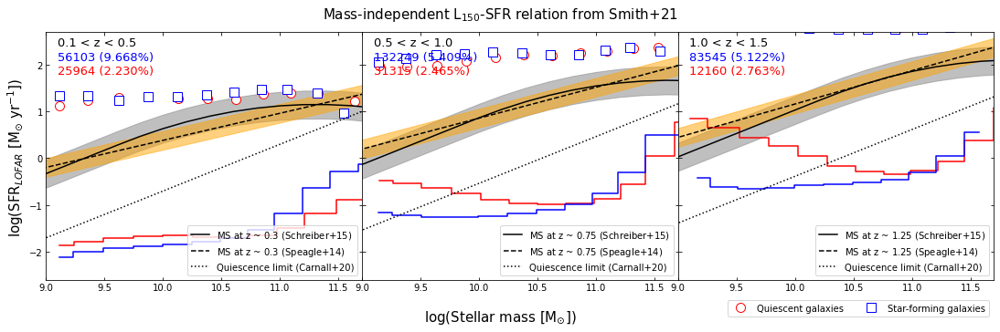

In [17]:
#%% Plotting Star formation rate vs Stellar mass
fig, axs = plt.subplots(1,3,figsize=(15,5), sharey=True)
for i,za,zb,sfrlim in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5],[SFR_033,SFR_075,SFR_125]):
    z = (za+zb)/2
    data = results_table[(results_table['Median_redshift']>za)&(results_table['Median_redshift']<=zb)&(results_table['Detections']==1)]
    axs[i].errorbar(data.loc[(data['Type']=='QG'),'Median_mass'],
                   np.log10(data.loc[(data['Type']=='QG'),'SFR_H']),
                   fmt='o',mfc='w',mec='r',ms=10,ecolor='r',barsabove=True,capsize=2.5,label='_Quiescent galaxies')
    axs[i].errorbar(data.loc[(data['Type']=='SFG'),'Median_mass'],
                   np.log10(data.loc[(data['Type']=='SFG'),'SFR_H']),
                   fmt='s',mfc='w',mec='b',ms=10,ecolor='b',barsabove=True,capsize=2.5,label='_Star-forming galaxies')
    axs[i].step(data.loc[(data['Type']=='QG')&(data['Detections']==1),'Median_mass'],
                np.log10(sfrlim/np.sqrt(data.loc[(data['Type']=='QG')&(data['Detections']==1),'Count'])),
                color='r',where='mid')
    axs[i].step(data.loc[(data['Type']=='SFG')&(data['Detections']==1),'Median_mass'],
                np.log10(sfrlim/np.sqrt(data.loc[(data['Type']=='SFG')&(data['Detections']==1),'Count'])),
                color='b',where='mid')
    axs[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    axs[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.5,color='grey')
    axs[i].plot([8,13],[SpeagleMS(8,z),SpeagleMS(13,z)],ls='--',color='k',label=f'MS at z ~ ${z}$ (Speagle+14)')
    axs[i].plot([8,13],[CarnallQ(8,z),CarnallQ(13,z)],ls=':',color='k',label=f'Quiescence limit (Carnall+20)')
    axs[i].fill_between(m,SpeagleMS(m,z)-0.2,SpeagleMS(m,z)+0.2,alpha=0.5,color='orange')
#    axs[i].axhline(np.log10(sfrlim),c='purple')
    SFG, SFGdetec = data.loc[(data['Type']=='SFG')&(data['Detections']==1),['Count','Radio_detected']].sum()
    QG,  QGdetec  = data.loc[(data['Type']=='QG')&(data['Detections']==1), ['Count','Radio_detected']].sum()
    axs[i].text(9.1,2.4,f'{za} < z < {zb}',size=13,color='k')
    axs[i].text(9.1,2.1,f'{SFG} ({SFGdetec/SFG:.3%})',size=13,color='b')
    axs[i].text(9.1,1.8,f'{QG} ({QGdetec/QG:.3%})',size=13,color='r')
    axs[i].set_ylim(ymin=-2.6,ymax=2.7)
    axs[i].set_xlim(xmin=9,xmax=11.7)
    axs[i].tick_params(which='both',top=True,right=True,direction='in')
    axs[i].legend(numpoints=1, loc='lower right')
fig.suptitle('Mass-independent L$_{150}$-SFR relation from Smith+21',fontsize=15,y=0.96)
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=15)
fig.text(0.0, 0.5,"log(SFR$_{LOFAR}$ [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=15, rotation='vertical')
marker1=plt.errorbar([],[],fmt='o',mfc='w',mec='r',ms=10,ecolor='r',label='Quiescent galaxies')
marker2=plt.errorbar([],[],fmt='s',mfc='w',mec='b',ms=10,ecolor='b',label='Star-forming galaxies')
fig.legend(handles=[marker1,marker2],numpoints=1, loc='lower right',bbox_to_anchor=(1,0),ncol=2)
fig.subplots_adjust(left=0.04,right=1,wspace=0)
plt.show()

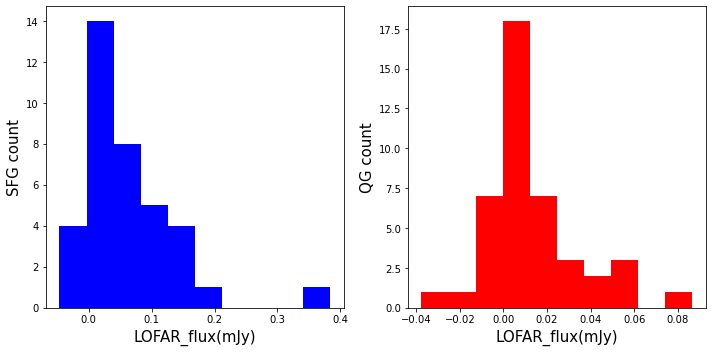

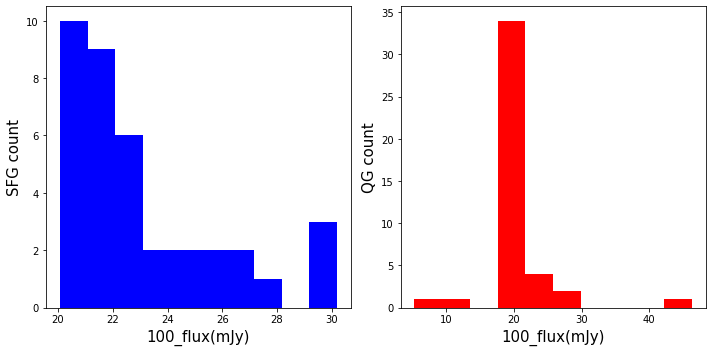

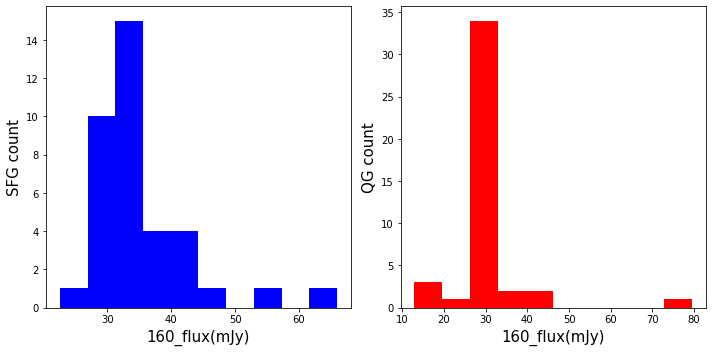

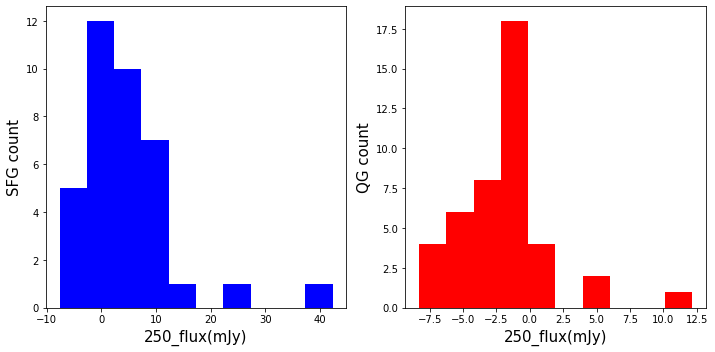

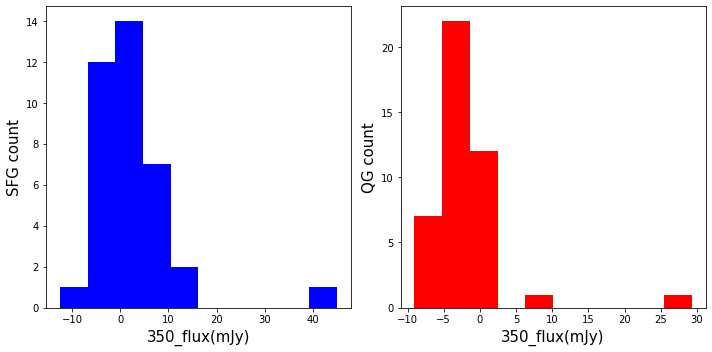

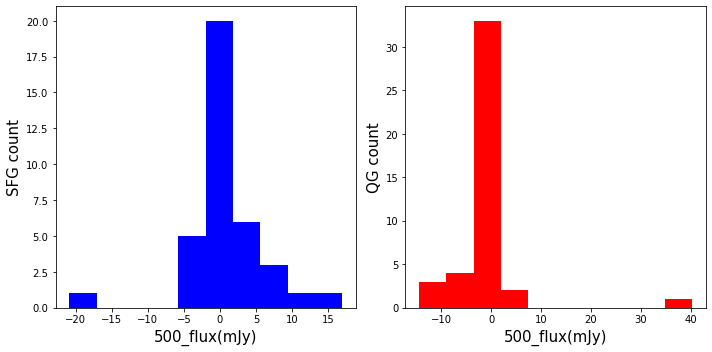

In [18]:
for band in ['LOFAR_flux(mJy)','100_flux(mJy)','160_flux(mJy)','250_flux(mJy)','350_flux(mJy)','500_flux(mJy)']:
    fig, ax = plt.subplots(1,2,figsize=(10,5))
    for n,gtype,c in zip([0,1],['SFG','QG'],['b','r']):
        ax[n].hist(results_table.loc[results_table['Type']==gtype,band],color=c)
        ax[n].set_xlabel(band,size=15)
        ax[n].set_ylabel(gtype+' count',size=15)
    
    fig.tight_layout()
    plt.show

In [67]:
def get_flux(group_name,image_data,W,pixscale,FWHM,unit):
    ''' Create cutouts of the sources listed in group_name, taken from the map in image_data using
        the world coordinate system W. Stack images to get the median value in each pixel. Extract
        the flux from stack performing aperture photometry with a radius equal to FWHM, converted 
        from arcsec into pixels with pixscale.
        Returns flux and error in mJy
    '''
    group = grouped_1.get_group(group_name)
    cutout_list=[]
    for ra,dec in zip(group.loc[:,'RA_1'],group.loc[:,'DEC_1']):
        world_coords = [ra,dec]
        pixel_coords = W.all_world2pix([world_coords], 0)
        position = (pixel_coords[0][0],pixel_coords[0][1])
        size = (FWHM*2/pixscale+2, FWHM*2/pixscale+2) # twice the fwhm plus 2 pixels
        cutout = Cutout2D(image_data, position, size,mode='partial') # no trimming of cutouts
        cutout_list.append(cutout.data)
    
    cutout_list = np.array(cutout_list)

    stack = np.median(cutout_list,axis=0)
    side = stack.shape[0]/2
                                    # aperture center position in pixel coordinates
    aperture = CircularAperture((side-0.5,side-0.5),r=FWHM/pixscale)
    flux_list=[]
    for item in cutout_list:
        phot_table = aperture_photometry(item, aperture)
        flux_list.append(phot_table['aperture_sum'][0])
    phot_flux = aperture_photometry(stack, aperture)
    plt.hist(flux_list)
    plt.axvline(np.mean(flux_list),c='k')
    plt.axvline(np.median(flux_list),c='orange')
    plt.axvline(phot_flux['aperture_sum'][0],c='r')
    plt.yscale('log')
    plt.show()
    
    if unit=='Jy/pix':
        median_flux = phot_table['aperture_sum'][0]
    elif unit=='Jy/beam':
        pixarea = pixscale**2 # pixel area in arcsec^2/pixel
        beamarea = np.pi*((FWHM**2)/(4*np.log(2))) # beam area in arcsec^2/beam
        median_flux = (phot_table['aperture_sum'][0])*pixarea/beamarea # converting to Jy/pixel
    elif unit=='MJy/sr':
        pixarea = pixscale**2 # pixel area in arcsec^2/pixel
        srarea = 4.25*10**10 # 1 sr area in arcsec^2/sr
        median_flux = (phot_table['aperture_sum'][0])*(10**6)*pixarea/srarea # converting to Jy/pixel        
    else: print('unspecified map unit')
    print(group_name,len(cutout_list))
    del group
    
    return median_flux*1000 # from Jy to mJy

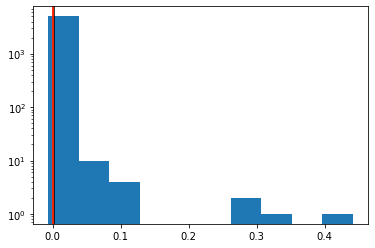

('SFG', 0.0, 10.0) 5056


0.8047852658934119

In [69]:
get_flux(('SFG', 0.0, 10.0),imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit=unit_lofar)

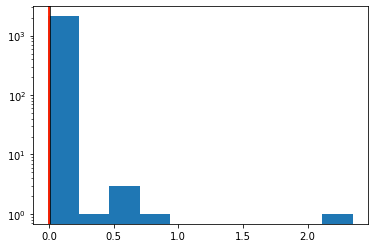

('QG', 0.0, 10.0) 2127


0.4196743010149424

In [70]:
get_flux(('QG', 0.0, 10.0),imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit=unit_lofar)

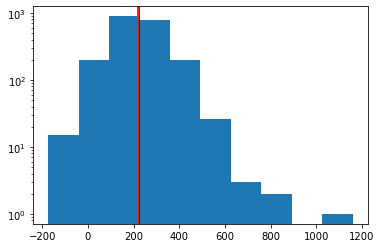

('QG', 0.0, 10.0) 2127


42.91340384823441

In [71]:
get_flux(('QG', 0.0, 10.0),imdata_100,w_100,pixscale_100,FWHM=fwhm_100,unit=unit_100)

In [46]:
# Create table with fluxes and their uncertainties
time_start = time()
results_table = pd.DataFrame({})
for name in grouped_1.groups.keys():
    
    flux_lofar,std_lofar = get_flux_and_unc(name,imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit='Jy/beam')    
    flux_100,std_100 = get_flux_and_unc(name,imdata_100,w_100,pixscale_100,FWHM=fwhm_100,unit='Jy/pix')
    flux_160,std_160 = get_flux_and_unc(name,imdata_160,w_160,pixscale_160,FWHM=fwhm_160,unit='Jy/pix')
    flux_250,std_250 = get_flux_and_unc(name,imdata_250,w_250,pixscale_250,FWHM=fwhm_250,unit='Jy/beam')
    flux_350,std_350 = get_flux_and_unc(name,imdata_350,w_350,pixscale_350,FWHM=fwhm_350,unit='Jy/beam')
    flux_500,std_500 = get_flux_and_unc(name,imdata_500,w_500,pixscale_500,FWHM=fwhm_500,unit='Jy/beam')
        
    results_table = results_table.append(pd.DataFrame({"Type":[name[0]],
                                                       "Detections":[True],
                                                       "Redshift_range":[f'{name[1]} - {name[1]+z_binwidth}'],
                                                       "Median_redshift":[grouped_1.get_group(name).median()['z']],
                                                       "Mass_range":[f'{name[2]} - {name[2]+mass_binwidth}'],
                                                       "Median_mass":[grouped_1.get_group(name).median()['Mass_median_2']],
                                                       "Count":[len(grouped_1.get_group(name))],#}),ignore_index=True)
                                                       "IR_detected":[grouped_1.get_group(name).count().loc['F_PACS_100_1']],
                                                       "Radio_detected":[grouped_1.get_group(name).count().loc['Peak_flux']],
                                                       "IRRadio_detected":[grouped_1.get_group(name).count().loc['IRRadio']],
                                                       "LOFAR_flux(mJy)":[flux_lofar],
                                                       "LOFAR_std(mJy)":[std_lofar],
                                                       "100_flux(mJy)":[flux_100],
                                                       "100_std(mJy)":[std_100],
                                                       "160_flux(mJy)":[flux_160],
                                                       "160_std(mJy)":[std_100],
                                                       "250_flux(mJy)":[flux_250],
                                                       "250_std(mJy)":[std_100],
                                                       "350_flux(mJy)":[flux_350],
                                                       "350_std(mJy)":[std_100],
                                                       "500_flux(mJy)":[flux_500],
                                                       "500_std(mJy)":[std_100]}),ignore_index=True)

time_end = time()
print()
print(time_end-time_start)

('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 

('QG', 0.5, 12.0) 5
('QG', 0.5, 12.0) 5
('QG', 0.5, 12.0) 5
('QG', 0.5, 12.25) 1
('QG', 0.5, 12.25) 1
('QG', 0.5, 12.25) 1
('QG', 0.5, 12.25) 1
('QG', 0.5, 12.25) 1
('QG', 0.5, 12.25) 1
('QG', 1.0, 9.0) 15
('QG', 1.0, 9.0) 15
('QG', 1.0, 9.0) 15
('QG', 1.0, 9.0) 15
('QG', 1.0, 9.0) 15
('QG', 1.0, 9.0) 15
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5)

In [52]:
# Create table with fluxes and their uncertainties
time_start = time()
for name in grouped_2.groups.keys():
    
    flux_lofar,std_lofar = get_flux_and_unc(name,imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit='Jy/beam')    
    flux_100,std_100 = get_flux_and_unc(name,imdata_100,w_100,pixscale_100,FWHM=fwhm_100,unit='Jy/pix')
    flux_160,std_160 = get_flux_and_unc(name,imdata_160,w_160,pixscale_160,FWHM=fwhm_160,unit='Jy/pix')
    flux_250,std_250 = get_flux_and_unc(name,imdata_250,w_250,pixscale_250,FWHM=fwhm_250,unit='Jy/beam')
    flux_350,std_350 = get_flux_and_unc(name,imdata_350,w_350,pixscale_350,FWHM=fwhm_350,unit='Jy/beam')
    flux_500,std_500 = get_flux_and_unc(name,imdata_500,w_500,pixscale_500,FWHM=fwhm_500,unit='Jy/beam')
        
    results_table = results_table.append(pd.DataFrame({"Type":[name[0]],
                                                       "Detections":[False],
                                                       "Redshift_range":[f'{name[1]} - {name[1]+z_binwidth}'],
                                                       "Median_redshift":[grouped_2.get_group(name).median()['z']],
                                                       "Mass_range":[f'{name[2]} - {name[2]+mass_binwidth}'],
                                                       "Median_mass":[grouped_2.get_group(name).median()['Mass_median_2']],
                                                       "Count":[len(grouped_2.get_group(name))],#}),ignore_index=True)
                                                       "IR_detected":[grouped_2.get_group(name).count().loc['F_PACS_100_1']],
                                                       "Radio_detected":[grouped_2.get_group(name).count().loc['Peak_flux']],
                                                       "IRRadio_detected":[grouped_2.get_group(name).count().loc['IRRadio']],
                                                       "LOFAR_flux(mJy)":[flux_lofar],
                                                       "LOFAR_std(mJy)":[std_lofar],
                                                       "100_flux(mJy)":[flux_100],
                                                       "100_std(mJy)":[std_100],
                                                       "160_flux(mJy)":[flux_160],
                                                       "160_std(mJy)":[std_100],
                                                       "250_flux(mJy)":[flux_250],
                                                       "250_std(mJy)":[std_100],
                                                       "350_flux(mJy)":[flux_350],
                                                       "350_std(mJy)":[std_100],
                                                       "500_flux(mJy)":[flux_500],
                                                       "500_std(mJy)":[std_100]}),ignore_index=True)

time_end = time()
print()
print(time_end-time_start)

('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.0) 23
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.25) 18
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.5) 13
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 9.75) 7
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.0) 14
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.25) 11
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 0.0, 10.5) 8
('IRBQG', 

('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.25) 35
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.5) 97
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 9.75) 213
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.0) 593
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.25) 1562
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.5) 2605
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 10.75) 3476
('QG', 1.0, 11.0) 2446
('QG', 1.0, 11.0) 2446
('QG', 1.0, 11.0) 

In [53]:
results_table

,Type,Detections,Redshift_range,Median_redshift,Mass_range,Median_mass,Count,IR_detected,Radio_detected,IRRadio_detected,...,100_flux(mJy),100_std(mJy),160_flux(mJy),160_std(mJy),250_flux(mJy),250_std(mJy),350_flux(mJy),350_std(mJy),500_flux(mJy),500_std(mJy)
0,IRBQG,True,0.0 - 0.5,0.37800,9.0 - 9.25,9.109751,23,23,0,0,...,210281.456423,17615.100344,151434.310006,17615.100344,-2.678154,17615.100344,-1.983864,17615.100344,-0.357004,17615.100344
1,IRBQG,True,0.0 - 0.5,0.42530,9.25 - 9.5,9.348356,18,18,0,0,...,179390.345249,12835.725853,143737.707342,12835.725853,-0.142607,12835.725853,-0.627933,12835.725853,1.115424,12835.725853
2,IRBQG,True,0.0 - 0.5,0.35820,9.5 - 9.75,9.602550,13,13,0,0,...,251677.663124,32835.593940,151474.145072,32835.593940,0.343247,32835.593940,-2.747367,32835.593940,-2.656297,32835.593940
3,IRBQG,True,0.0 - 0.5,0.41300,9.75 - 10.0,9.899337,7,7,2,2,...,250757.813007,64656.582959,159344.724088,64656.582959,4.472637,64656.582959,5.957646,64656.582959,5.626614,64656.582959
4,IRBQG,True,0.0 - 0.5,0.41805,10.0 - 10.25,10.098475,14,14,4,4,...,264239.765935,36426.092111,167941.080304,36426.092111,1.420523,36426.092111,-4.001265,36426.092111,-4.620785,36426.092111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212,SFG,False,1.0 - 1.5,1.13190,10.5 - 10.75,10.615655,7213,4801,0,0,...,229514.268474,1148.232946,155849.940379,1148.232946,2.446639,1148.232946,1.939753,1148.232946,0.889774,1148.232946
213,SFG,False,1.0 - 1.5,1.15220,10.75 - 11.0,10.853324,4895,3333,0,0,...,231531.249544,1308.709059,159467.436677,1308.709059,4.259783,1308.709059,3.837120,1308.709059,2.021808,1308.709059
214,SFG,False,1.0 - 1.5,1.17080,11.0 - 11.25,11.085432,1787,1239,0,0,...,234517.521749,1885.064067,163623.783241,1885.064067,6.577264,1885.064067,6.387285,1885.064067,3.764558,1885.064067
215,SFG,False,1.0 - 1.5,1.21060,11.25 - 11.5,11.329591,364,228,0,0,...,233518.396932,4630.459429,163782.857760,4630.459429,7.627386,4630.459429,7.997043,4630.459429,5.504959,4630.459429


## Saving table with stacking results
### BE EXTRA CAREFUL NOT TO OVERWRITE FILES IN THIS SECTION

In [54]:
results_table.to_csv(path+'Results/results_stacked_'+field+'_'+strftime("%Y-%m-%d",localtime())+'.csv',index=False)

#results_table_1.to_csv(path+'Results/Bootes_full_detected_count.csv',index=False)

## Creating and saving cutout images

[216.76040240000003, 32.5811445]
[[12428.65651598  5332.96680475]]
(12429, 5333)
[[216.76023235  32.58115658]]


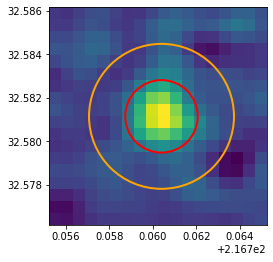

In [60]:
ra=table.at[42322,'RA_1']
dec=table.at[42322,'DEC_1']

circle1 = plt.Circle((ra, dec), fwhm_lofar/3600, color='r',lw=2,fill=False)
circle2 = plt.Circle((ra, dec), 2*fwhm_lofar/3600, color='orange',lw=2,fill=False)

world_coords = [ra,dec]
print(world_coords)
pixel_coords = w_lofar.all_world2pix([world_coords], 0)
position = (pixel_coords[0][0],pixel_coords[0][1])
print(pixel_coords)
width=12.*2/pixscale_lofar+2 # twice the fwhm plus 2 pixels
size = (width,width)
cutout = Cutout2D(imdata_lofar, position, size,mode='partial') # no trimming of cutouts
print(cutout.position_original)
coords = w_lofar.all_pix2world([cutout.position_original], 0)
print(coords)
fig, ax = plt.subplots(figsize=(4,4))
ax.imshow(cutout.data,extent=[coords[0][0]-width/3600,coords[0][0]+width/3600,coords[0][1]-width/3600,coords[0][1]+width/3600],origin='lower')
ax.add_patch(circle1)
ax.add_patch(circle2)

fig.savefig(path+'Cutouts/holi1.png', bbox_inches='tight', format='png')

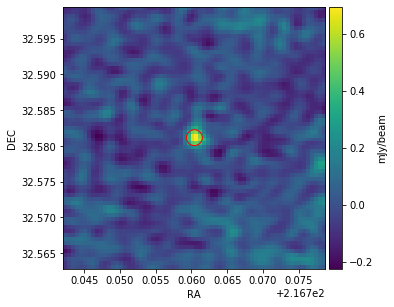

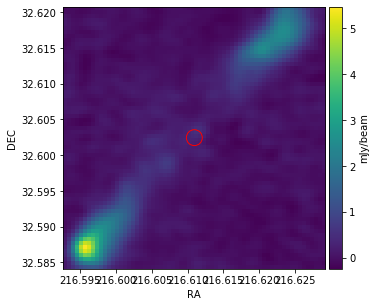

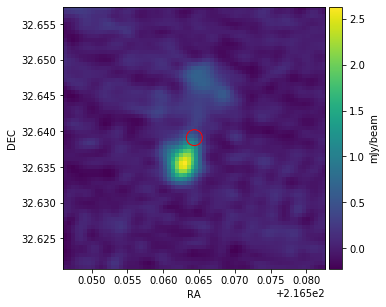

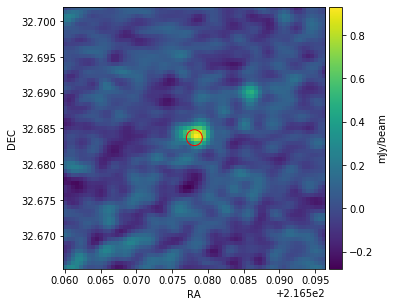

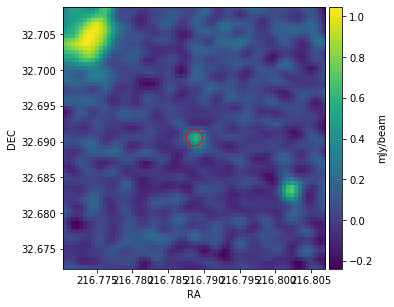

...

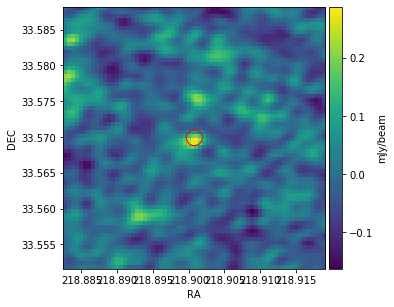

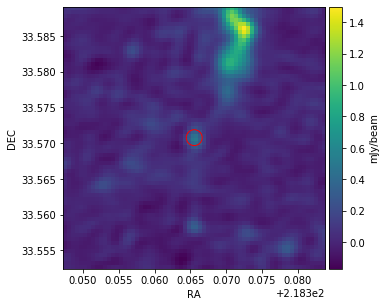

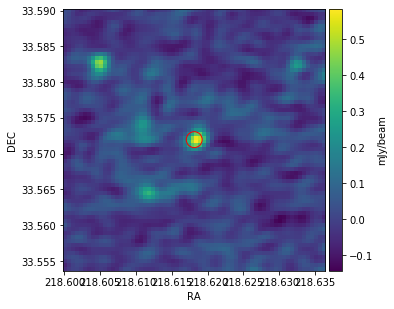

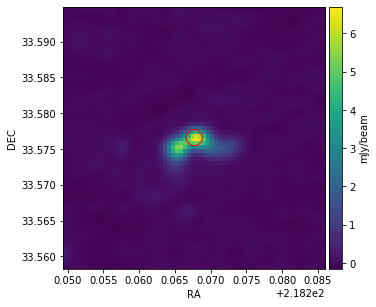

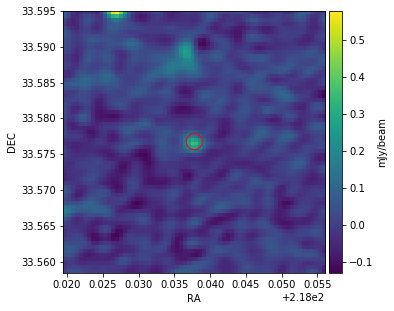

In [92]:
counter=0
for index,ra,dec,code in zip(grouped.get_group('QG').loc[~np.isnan(table['IRRadio'])].index,grouped.get_group('QG').loc[~np.isnan(table['IRRadio']),'RA_1'],grouped.get_group('QG').loc[~np.isnan(table['IRRadio']),'DEC_1'],grouped.get_group('QG').loc[~np.isnan(table['IRRadio']),'S_Code']):
    if counter>=200:
        break
    world_coords = [ra,dec]
    pixel_coords = w_lofar.all_world2pix([world_coords], 0)
    position = (pixel_coords[0][0],pixel_coords[0][1])
    width = 48.*2/pixscale_lofar+2  # 4 times the fwhm plus 2 pixels
    size = (width,width)
    cutout = Cutout2D(imdata_lofar, position, size,mode='partial') # no trimming of cutouts
    circle1 = plt.Circle((ra, dec), 6./(pixscale_lofar*3600), color='r',lw=1,fill=False)
    circle2 = plt.Circle((ra, dec), 12./(pixscale_lofar*3600), color='orange',lw=1,fill=False)
    fig, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(cutout.data*1000,extent=[ra-width/3600,ra+width/3600,dec-width/3600,dec+width/3600],origin='lower')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cb = fig.colorbar(im, cax=cax)
    cb.set_label('mJy/beam',size=10)
    ax.add_patch(circle1)
    #ax.add_patch(circle2)
    ax.set_xlabel('RA')
    ax.set_ylabel('DEC')
    if code=='S':
        fig.savefig(path+'Cutouts/Radio/Single/'+str(code)+'_'+str(index)+'.png', bbox_inches='tight', format='png')
    elif code=='M':
        fig.savefig(path+'Cutouts/Radio/Multiple/'+str(code)+'_'+str(index)+'.png', bbox_inches='tight', format='png')
    elif code=='Z':
        fig.savefig(path+'Cutouts/Radio/Compound/'+str(code)+'_'+str(index)+'.png', bbox_inches='tight', format='png')
    else:
        fig.savefig(path+'Cutouts/Radio/'+str(code)+'_'+str(index)+'.png', bbox_inches='tight', format='png')
    plt.show()
    plt.close()
    counter+=1

In [56]:
from astropy.stats import sigma_clip
from astropy.stats import sigma_clipped_stats
from photutils.segmentation import make_source_mask

In [111]:
sf_stack_1 = get_stacked_image(('SFG', 0.5, 10.5),imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit='Jy/beam')  

('SFG', 0.5, 10.5) 10087


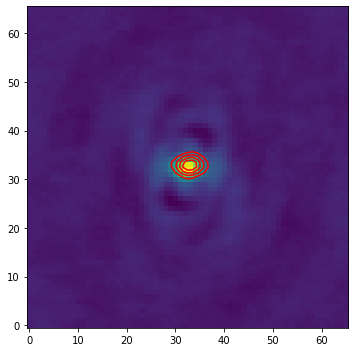

In [89]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(sf_stack_1,origin='lower')
ax.contour(sf_stack_1*1000,origin='lower',colors='r',levels=np.linspace(np.max(sf_stack_1*1000)/3,np.max(sf_stack_1*1000),5))
fig.tight_layout()
plt.show()

In [62]:
mean, median, std = sigma_clipped_stats(sf_stack_1, sigma=3.0)
print((mean, median, std))

(5.009492838325968e-07, 4.643247280000651e-07, 1.3625581232190598e-06)


In [128]:
filtered_data = sigma_clip(sf_stack_1, sigma=5, maxiters=5)
mean, median, std = sigma_clipped_stats(filtered_data, sigma=3.0)
print(mean, median, std)

0.0019805931951850653 0.0016634800704196095 0.0026864297688007355


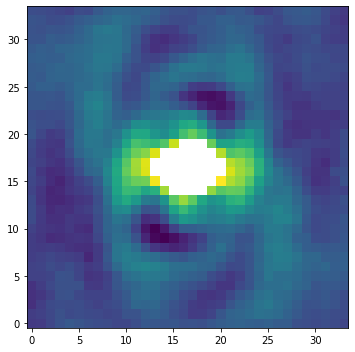

In [119]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(filtered_data,origin='lower')
#ax.contour(sf_stack_1*1000,origin='lower',colors='r',levels=np.arange(0.01,0.035,0.005))
fig.tight_layout()
plt.show()

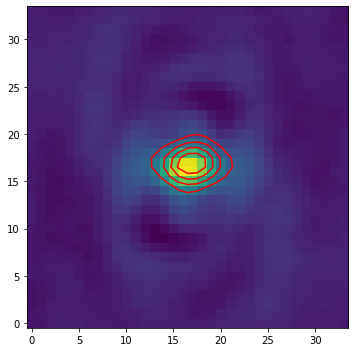

In [130]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(sf_stack_1,origin='lower')
levels = np.linspace(np.max(filtered_data*1000),np.max(sf_stack_1*1000),5)
#levels = np.arange(0,np.max(sf_stack_1*1000),(np.max(sf_stack_1*1000)-np.max(filtered_data*1000))/5)
ax.contour(sf_stack_1*1000,origin='lower',colors='r',levels=levels)
fig.tight_layout()
plt.show()

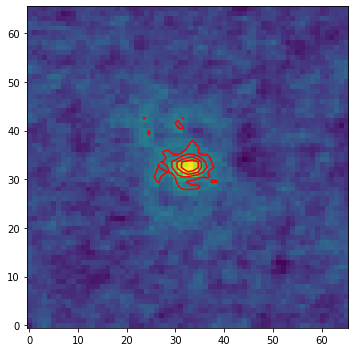

In [90]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(qg_stack_1,origin='lower')
ax.contour(qg_stack_1*1000,origin='lower',colors='r',levels=np.linspace(np.max(qg_stack_1*1000)/3,np.max(qg_stack_1*1000),5))
fig.tight_layout()
plt.show()

In [121]:
filtered_data = sigma_clip(qg_stack_1, sigma=5, maxiters=5)
mean, median, std = sigma_clipped_stats(filtered_data, sigma=3.0)
print(mean, median, std)

0.0015841596759855747 0.0015449197962880135 0.001115922350436449


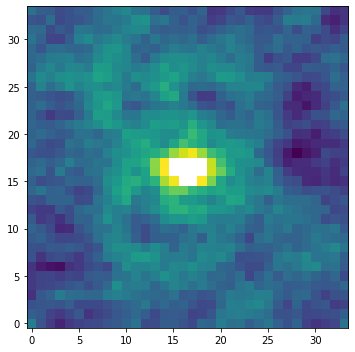

In [122]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(filtered_data,origin='lower')
#ax.contour(sf_stack_1*1000,origin='lower',colors='r',levels=np.arange(0.01,0.035,0.005))
fig.tight_layout()
plt.show()

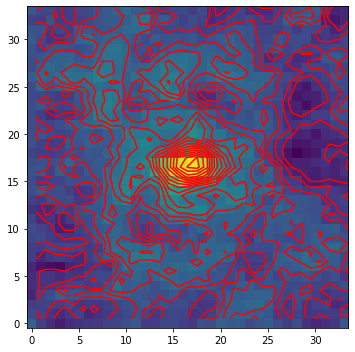

In [127]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(qg_stack_1,origin='lower')
levels = np.arange(0,np.max(qg_stack_1*1000),(np.max(qg_stack_1*1000)-np.max(filtered_data*1000))/5)
ax.contour(qg_stack_1*1000,origin='lower',colors='r',levels=levels)
fig.tight_layout()
plt.show()

In [93]:
def get_stacked_image(group_name,image_data,W,pixscale,FWHM,unit):
    ''' Create cutouts of the sources listed in group_name, taken from the map in image_data using
        the world coordinate system W. Stack cutouts to get the median value in each pixel.
        Save the stacked cutout as an image.
    '''
    cutout_list=[]
    for ra,dec in zip(grouped_1.get_group(group_name).loc[:,'RA_1'],grouped_1.get_group(group_name).loc[:,'DEC_1']):
        world_coords = [ra,dec]
        pixel_coords = W.all_world2pix([world_coords], 0)
        position = (pixel_coords[0][0],pixel_coords[0][1])
        size = (FWHM*16/pixscale+2, FWHM*16/pixscale+2) # 16 times the fwhm plus 2 pixels
        cutout = Cutout2D(image_data, position, size,mode='partial') # no trimming of cutouts
        cutout_list.append(cutout.data)
    
    cutout_list = np.array(cutout_list)
    stack = np.median(cutout_list,axis=0)
    print(group_name,len(cutout_list))
    side = stack.shape[0]/2
    
    if FWHM == fwhm_lofar:
        tag = 'lofar'
    elif FWHM == fwhm_100:
        tag = '100'
    elif FWHM == fwhm_160:
        tag = '160'
    elif FWHM == fwhm_250:
        tag = '250'
    elif FWHM == fwhm_350:
        tag = '350'
    elif FWHM == fwhm_500:
        tag = '500'    
    
    circle1 = plt.Circle((side-0.5, side-0.5), FWHM/(2*pixscale), color='r',lw=1,fill=False)
    circle2 = plt.Circle((side-0.5, side-0.5), FWHM/pixscale, color='orange',lw=1,fill=False)
    fig, ax = plt.subplots(figsize=(4,4))
    im = ax.imshow(stack*1000,origin='lower')
    fig.suptitle(group_name[0]+'  z>'+str(group_name[1])+'  M$_*$>'+f'{group_name[2]:.4}'+'  n='+str(len(cutout_list)))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cb = fig.colorbar(im, cax=cax)
    cb.set_label('m'+unit,size=15)
    ax.add_patch(circle1)
    ax.add_patch(circle2)
    fig.savefig(path+'Cutouts/Stacks/'+group_name[0]+'/'+'4_'+group_name[0]+'_'+str(group_name[1]).replace('.','-')+'_'+f'{group_name[2]:.4}'.replace('.','-')+'_'+tag+'.png', bbox_inches='tight', format='png')
    plt.close()
    
    return None

In [135]:
def get_stacked_image(group_name,image_data,W,pixscale,FWHM,unit):
    ''' Create cutouts of the sources listed in group_name, taken from the map in image_data using
        the world coordinate system W. Stack cutouts to get the median value in each pixel.
        Save the stacked cutout as an image.
    '''
    cutout_list=[]
    for ra,dec in zip(grouped_1.get_group(group_name).loc[:,'RA_1'],grouped_1.get_group(group_name).loc[:,'DEC_1']):
        world_coords = [ra,dec]
        pixel_coords = W.all_world2pix([world_coords], 0)
        position = (pixel_coords[0][0],pixel_coords[0][1])
        size = (FWHM*16/pixscale+2, FWHM*16/pixscale+2) # 16 times the fwhm plus 2 pixels
        cutout = Cutout2D(image_data, position, size,mode='partial') # no trimming of cutouts
        cutout_list.append(cutout.data)
    
    cutout_list = np.array(cutout_list)
    stack = np.median(cutout_list,axis=0)*1000
    print(group_name,len(cutout_list))
    side = stack.shape[0]/2
    
    if FWHM == fwhm_lofar:
        tag = 'lofar'
    elif FWHM == fwhm_100:
        tag = '100'
    elif FWHM == fwhm_160:
        tag = '160'
    elif FWHM == fwhm_250:
        tag = '250'
    elif FWHM == fwhm_350:
        tag = '350'
    elif FWHM == fwhm_500:
        tag = '500'    
    
    filtered_data = sigma_clip(stack, sigma=5, maxiters=5)
    mean, median, std = sigma_clipped_stats(filtered_data, sigma=3.0)
    fig, ax = plt.subplots(figsize=(8,8))
    im = ax.imshow(stack,origin='lower')
    levels = np.linspace(np.max(filtered_data),np.max(stack),5)
    ax.contour(stack,origin='lower',colors='r',levels=levels)
    fig.suptitle(group_name[0]+'  z>'+str(group_name[1])+'  M$_*$>'+f'{group_name[2]:.4}'+'  n='+str(len(cutout_list)))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cb = fig.colorbar(im, cax=cax)
    cb.set_label('m'+unit,size=15)
    fig.savefig(path+'Cutouts/Stacks/'+group_name[0]+'/'+'5_'+group_name[0]+'_'+str(group_name[1]).replace('.','-')+'_'+f'{group_name[2]:.4}'.replace('.','-')+'_'+tag+'.png', bbox_inches='tight', format='png')
    plt.close()
    
    return stack

In [ ]:
# Save stacked cutouts as images
time_start = time()
#counter=0
for name in grouped_1.groups.keys():
#    if counter>=15:
#        break
    get_stacked_image(name,imdata_lofar,w_lofar,pixscale_lofar,FWHM=fwhm_lofar,unit='Jy/beam')    
    #get_stacked_image(name,imdata_100,w_100,pixscale_100,FWHM=fwhm_100,unit='Jy/pix')
    #get_stacked_image(name,imdata_160,w_160,pixscale_160,FWHM=fwhm_160,unit='Jy/pix')
    #get_stacked_image(name,imdata_250,w_250,pixscale_250,FWHM=fwhm_250,unit='Jy/beam')
    #get_stacked_image(name,imdata_350,w_350,pixscale_350,FWHM=fwhm_350,unit='Jy/beam')
    #get_stacked_image(name,imdata_500,w_500,pixscale_500,FWHM=fwhm_500,unit='Jy/beam')
#    counter+=1
    
time_end = time()
print()
print(time_end-time_start)

('IRBQG', 0.0, 9.0) 36


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 0.0, 9.25) 17


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 0.0, 9.5) 15


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 0.0, 9.75) 20


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 0.0, 10.0) 20
('IRBQG', 0.0, 10.25) 13
('IRBQG', 0.0, 10.5) 6
('IRBQG', 0.0, 10.75) 2
('IRBQG', 0.5, 9.0) 31


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 0.5, 9.25) 27


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 0.5, 9.5) 29


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 0.5, 9.75) 39


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 0.5, 10.0) 33
('IRBQG', 0.5, 10.25) 82
('IRBQG', 0.5, 10.5) 81
('IRBQG', 0.5, 10.75) 77
('IRBQG', 0.5, 11.0) 52
('IRBQG', 0.5, 11.25) 6
('IRBQG', 1.0, 9.0) 6


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 1.0, 9.25) 9


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 1.0, 9.5) 20


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 1.0, 9.75) 31


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 1.0, 10.0) 77


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 1.0, 10.25) 108


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('IRBQG', 1.0, 10.5) 158
('IRBQG', 1.0, 10.75) 140
('IRBQG', 1.0, 11.0) 69
('IRBQG', 1.0, 11.25) 26
('IRBQG', 1.0, 11.5) 4
('QG', 0.0, 9.0) 4166


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.0, 9.25) 3321


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.0, 9.5) 2695


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.0, 9.75) 2644


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.0, 10.0) 2838


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.0, 10.25) 3070
('QG', 0.0, 10.5) 2850
('QG', 0.0, 10.75) 1882
('QG', 0.0, 11.0) 678
('QG', 0.0, 11.25) 162


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.0, 11.5) 51


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.0, 11.75) 7


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.0, 12.0) 1


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.5, 9.0) 291


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.5, 9.25) 487


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.5, 9.5) 874


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.5, 9.75) 1941


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.5, 10.0) 4311


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.5, 10.25) 6825
('QG', 0.5, 10.5) 8770
('QG', 0.5, 10.75) 7955
('QG', 0.5, 11.0) 3866
('QG', 0.5, 11.25) 763
('QG', 0.5, 11.5) 20
('QG', 0.5, 11.75) 2


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 0.5, 12.0) 1
('QG', 1.0, 9.0) 10


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 1.0, 9.25) 29


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 1.0, 9.5) 112


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 1.0, 9.75) 334


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 1.0, 10.0) 921


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('QG', 1.0, 10.25) 2514
('QG', 1.0, 10.5) 5376
('QG', 1.0, 10.75) 6979
('QG', 1.0, 11.0) 4566
('QG', 1.0, 11.25) 1149
('QG', 1.0, 11.5) 84
('QG', 1.0, 11.75) 3
('SFG', 0.0, 9.0) 12953
('SFG', 0.0, 9.25) 9838
('SFG', 0.0, 9.5) 7773
('SFG', 0.0, 9.75) 6165
('SFG', 0.0, 10.0) 5002
('SFG', 0.0, 10.25) 3613
('SFG', 0.0, 10.5) 2211
('SFG', 0.0, 10.75) 833
('SFG', 0.0, 11.0) 107
('SFG', 0.0, 11.25) 6


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('SFG', 0.0, 11.75) 1
('SFG', 0.5, 9.0) 16589
('SFG', 0.5, 9.25) 21772
('SFG', 0.5, 9.5) 25330
('SFG', 0.5, 9.75) 24663
('SFG', 0.5, 10.0) 20099
('SFG', 0.5, 10.25) 14831
('SFG', 0.5, 10.5) 10087
('SFG', 0.5, 10.75) 5091
('SFG', 0.5, 11.0) 1192
('SFG', 0.5, 11.25) 84
('SFG', 0.5, 11.5) 5


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('SFG', 1.0, 9.0) 12409


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('SFG', 1.0, 9.25) 17736


<ipython-input-135-f6bf5540dfa5>:40: UserWarning: No contour levels were found within the data range.
  ax.contour(stack,origin='lower',colors='r',levels=levels)


('SFG', 1.0, 9.5) 19287
('SFG', 1.0, 9.75) 18176


## Estimating LIRs and SFRs from Herschel data
We can now check the number of entries wich have available data in the 2 PACS and 3 SPIRE bands from the Herschel space telescope.

In [30]:
q_PACS = len(table.query(quiescent).loc[np.isfinite(table['F_PACS_100']),:])
print(f"Fraction of quiescent galaxies with PACS data: {q_PACS/n_quiescent:.2%}")
sf_PACS = len(table.query(SF).loc[np.isfinite(table['F_PACS_100']),:])
print(f"Fraction of star forming galaxies with PACS data: {sf_PACS/n_star_forming:.2%}")
print("")
q_SPIRE = len(table.query(quiescent).loc[np.isfinite(table['F_SPIRE_500']),:])
print(f"Fraction of quiescent galaxies with SPIRE data: {q_SPIRE/n_quiescent:.2%}")
sf_SPIRE = len(table.query(SF).loc[np.isfinite(table['F_SPIRE_500']),:])
print(f"Fraction of star forming galaxies with SPIRE data: {sf_SPIRE/n_star_forming:.2%}")

Fraction of quiescent galaxies with PACS data: 41.20%
Fraction of star forming galaxies with PACS data: 39.52%

Fraction of quiescent galaxies with SPIRE data: 42.62%
Fraction of star forming galaxies with SPIRE data: 41.14%


We will now estimate the total infrared luminosities by redshifting and rescaling a modified greybody model to the available Herschel PACS + SPIRE data. The greybody + power law model is taken from Casey (2012).

In [31]:
from scipy.optimize import curve_fit
from scipy.integrate import quad
import astropy.units as u

In [32]:
def GreybodyPL(x,T,Nbb):
    '''Flux density in Jy at wavelength x in micron
    for full IR regime
    given by an optically thick grey-body modelmodified with a MIR power-law
    T is the temperature of the grey body and 
    Nbb is a normalization parameter'''
    alpha = 2.0
    beta = 1.5
    Lc = (26.68 + alpha*6.246)**-2 + (1.905*(10**-4) + alpha*7.243*(10**-5))*T # 1/turnover_wavelength
    Npl = Nbb*((1-np.exp(-(200*Lc)**beta))*(Lc**3))/(np.exp(14387.8*Lc/T)-1)
    flux = Nbb*((1-np.exp(-(200/x)**beta))*(x**-3))/(np.exp(14387.8/(x*T))-1) + Npl*np.exp(-(x*Lc*4/3)**2)*(x*Lc)**alpha
    return flux

In [33]:
def HerschelLIR(z_obj,S1,S2,S3,S4,S5):
    
    dlist=np.array([z_obj,S1,S2,S3,S4,S5])
    if (~np.isfinite(dlist)).any():
        return np.nan
    else:            
        x_data = np.array([100,160,250,350,500])
        y_data = np.array([S1,S2,S3,S4,S5])*10**-3 # data in mJy
        try:
            popt, pcov = curve_fit(GreybodyPL,x_data/(1+z_obj),y_data,p0=[30,10**4])
        except RuntimeError:
            return np.nan
        dist_factor = 4*np.pi*(cosmo.luminosity_distance(z_obj).to(u.meter).value)**2  # distance in Mpc
        integral, abserr = quad(lambda x: GreybodyPL(x,popt[0],popt[1])/(x**2),8,1000) # c/lambda^2 factor gives flux density per unit wavelength
        LIR = integral*3*(10**-12)*dist_factor  # 3*(10^8)*(10^-26)*(10^6)
                                                #    c    *   Jy   * 1/micron
        LIR_LSun = LIR/(3.828*10**26)
    
        return np.log10(LIR_LSun)

In [34]:
V_Herschel = np.vectorize(HerschelLIR)

In [35]:
table['LIR_H'] = V_Herschel(table['Z_BEST'],table['F_PACS_100'],table['F_PACS_160'],table['F_SPIRE_250'],table['F_SPIRE_350'],table['F_SPIRE_500'])

/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.
/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in exp
  # This is added back by InteractiveShellApp.init_path()


Now we can use LIR for each galaxy to calculate the SFR according to the Schmidt-Kennicutt law, adjusted to the Chabrier (2003) initial mass function.

In [36]:
table['SFR_H'] = np.power(10,table['LIR_H'])/(1.7*5.8*10**9)

Once again we can look at the distribution of the estimated SFR vs stellar mass for our star-forming and quiescent populations.

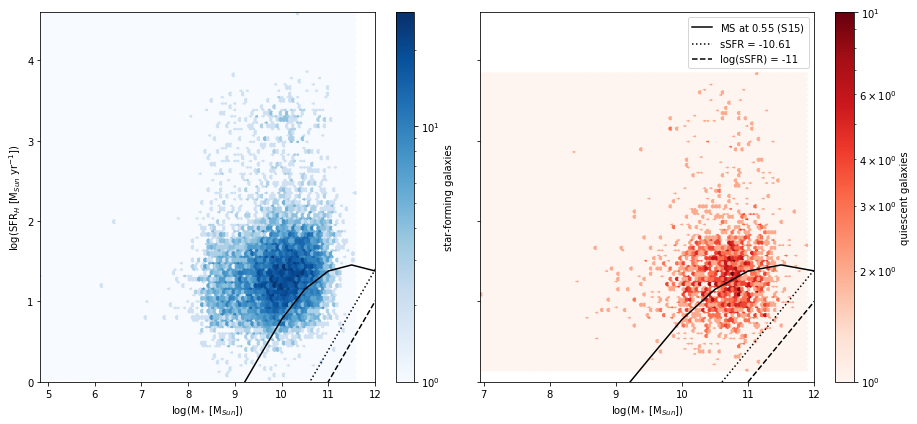

In [37]:
#%% Plotting Star formation rate vs Stellar mass
fig, axs = plt.subplots(1,2,sharey='row',figsize=(13,6))
axs[0].set_xlabel("log(M$_*$ [M$_{Sun}$])",fontsize=10)
axs[0].set_ylabel("log(SFR$_{H}$ [M$_{Sun}$ yr$^{-1}$])",fontsize=10)
hb = axs[0].hexbin(table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'Mass_median'],
            np.log10(table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'SFR_H']),
            cmap='Blues',bins='log')
cb = fig.colorbar(hb, ax=axs[0])
cb.set_label('star-forming galaxies')
axs[0].plot( m+9, logSFR, ls='-', c='k', label=f'MS at ${z}$ (S15)')
axs[0].plot([8,13],[8+age_factor,13+age_factor],':',color='k',label=f'sSFR = {age_factor:.4g}')
axs[0].plot([8,13],[-3,2],'--',color='k',label='log(sSFR) = -11')
axs[0].set_xlim(xmax=12)

axs[1].set_xlabel("log(M$_*$ [M$_{Sun}$])",fontsize=10)
hb = axs[1].hexbin(table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'Mass_median'],
            np.log10(table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'SFR_H']),
            cmap='Reds',bins='log')
cb = fig.colorbar(hb, ax=axs[1])
cb.set_label('quiescent galaxies')
axs[1].plot( m+9, logSFR, ls='-', c='k', label=f'MS at ${z}$ (S15)')
axs[1].plot([8,13],[8+age_factor,13+age_factor],':',color='k',label=f'sSFR = {age_factor:.4g}')
axs[1].plot([8,13],[-3,2],'--',color='k',label='log(sSFR) = -11')
axs[1].set_xlim(xmax=12)
axs[1].set_ylim(ymin=0,ymax=4.6)
axs[1].legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

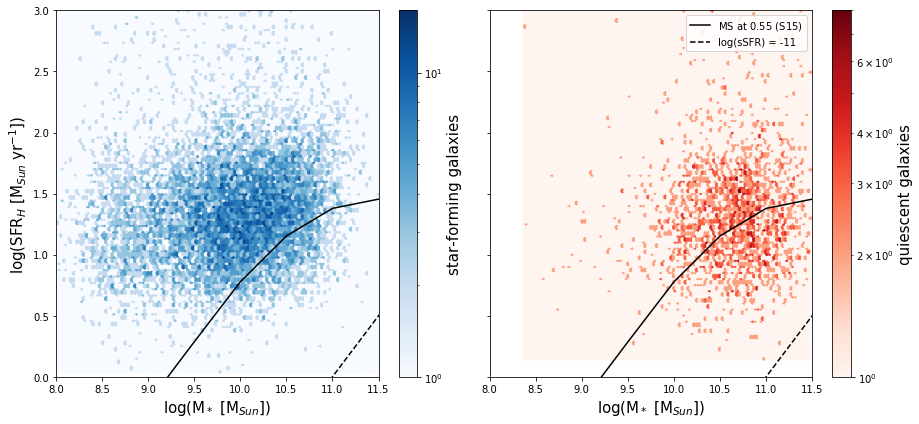

In [52]:
#%% Plotting Star formation rate vs Stellar mass
fig, axs = plt.subplots(1,2,sharey='row',sharex='row',figsize=(13,6))
axs[0].set_xlabel("log(M$_*$ [M$_{Sun}$])",fontsize=15)
axs[0].set_ylabel("log(SFR$_{H}$ [M$_{Sun}$ yr$^{-1}$])",fontsize=15)
hb = axs[0].hexbin(table.query('(0.5<Z_BEST<0.6)&(SFR_H<1000)&(8<Mass_median<11.5)&'+SF).loc[:,'Mass_median'],
            np.log10(table.query('(0.5<Z_BEST<0.6)&(SFR_H<1000)&(8<Mass_median<11.5)&'+SF).loc[:,'SFR_H']),
            cmap='Blues',bins='log')
cb = fig.colorbar(hb, ax=axs[0])
cb.set_label('star-forming galaxies',fontsize=15)
axs[0].plot( m+9, logSFR, ls='-', c='k', label=f'MS at ${z}$ (S15)')
#axs[0].plot([8,13],[8+age_factor,13+age_factor],':',color='k',label=f'sSFR = {age_factor:.4g}')
axs[0].plot([8,13],[-3,2],'--',color='k',label='log(sSFR) = -11')
axs[0].set_xlim(xmax=11.5)

axs[1].set_xlabel("log(M$_*$ [M$_{Sun}$])",fontsize=15)
hb = axs[1].hexbin(table.query('(0.5<Z_BEST<0.6)&(SFR_H<1000)&(8<Mass_median<11.5)&'+quiescent).loc[:,'Mass_median'],
            np.log10(table.query('(0.5<Z_BEST<0.6)&(SFR_H<1000)&(8<Mass_median<11.5)&'+quiescent).loc[:,'SFR_H']),
            cmap='Reds',bins='log')
cb = fig.colorbar(hb, ax=axs[1])
cb.set_label('quiescent galaxies',fontsize=15)
axs[1].plot( m+9, logSFR, ls='-', c='k', label=f'MS at ${z}$ (S15)')
#axs[1].plot([8,13],[8+age_factor,13+age_factor],':',color='k',label=f'sSFR = {age_factor:.4g}')
axs[1].plot([8,13],[-3,2],'--',color='k',label='log(sSFR) = -11')
axs[1].set_xlim(xmin=8,xmax=11.5)
axs[1].set_ylim(ymin=0,ymax=3)
axs[1].legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

We can even compare our two estimates for SFRs, and see that thosw calculated from Herschel data are systematically higher than those from Spitzer MIPS data. 

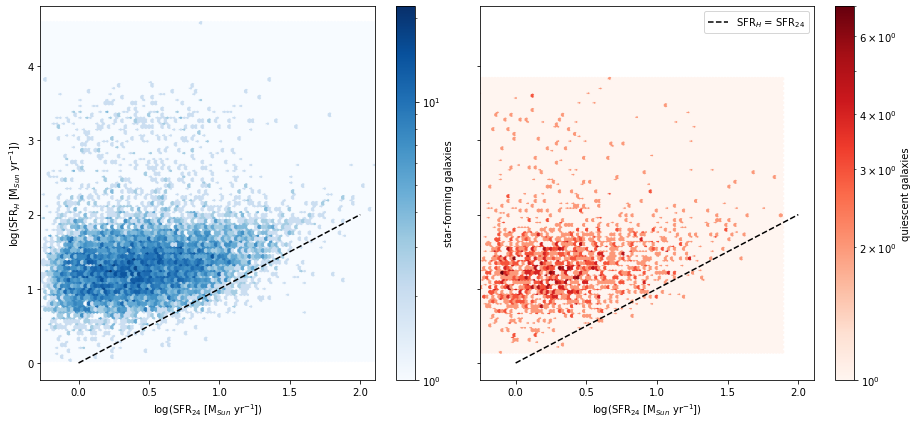

In [57]:
#%% Plotting Star formation rate calculated from Herschel and Spitzer data
fig, axs = plt.subplots(1,2,sharey='row',figsize=(13,6))
axs[0].set_xlabel("log(SFR$_{24}$ [M$_{Sun}$ yr$^{-1}$])",fontsize=10)
axs[0].set_ylabel("log(SFR$_{H}$ [M$_{Sun}$ yr$^{-1}$])",fontsize=10)
hb = axs[0].hexbin(np.log10(table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'SFR_24']),
            np.log10(table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'SFR_H']),
            cmap='Blues',bins='log')
cb = fig.colorbar(hb, ax=axs[0])
cb.set_label('star-forming galaxies')
axs[0].plot([0,2],[0,2],'--',color='k',label='SFR$_{H}$ = SFR$_{24}$')

axs[1].set_xlabel("log(SFR$_{24}$ [M$_{Sun}$ yr$^{-1}$])",fontsize=10)
hb = axs[1].hexbin(np.log10(table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'SFR_24']),
            np.log10(table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'SFR_H']),
            cmap='Reds',bins='log')
cb = fig.colorbar(hb, ax=axs[1])
cb.set_label('quiescent galaxies')
axs[1].plot([0,2],[0,2],'--',color='k',label='SFR$_{H}$ = SFR$_{24}$')
#axs[1].set_ylim(ymin=0,ymax=4.6)
axs[1].legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

Here we show the distribution of galaxies by SFR_24/SFR_H ratio vs Stellar mass

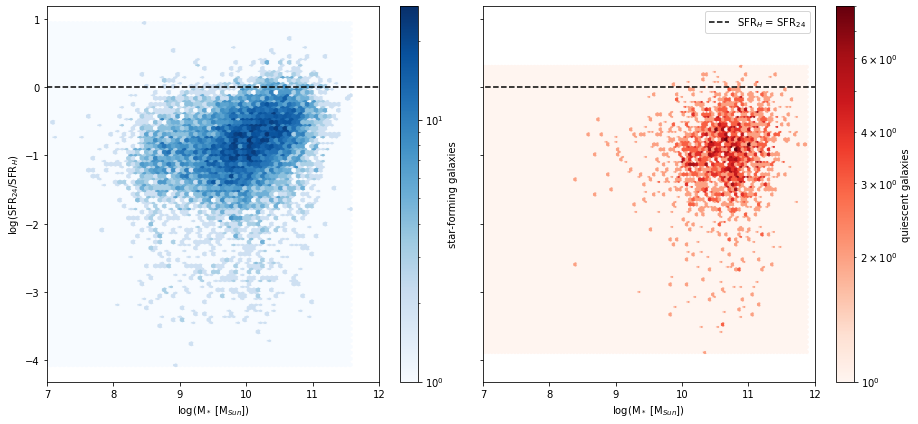

In [58]:
#%% Plotting SFR_24/SFR_H ratio vs Stellar mass
fig, axs = plt.subplots(1,2,sharey='row',figsize=(13,6))
axs[0].set_xlabel("log(M$_*$ [M$_{Sun}$])",fontsize=10)
axs[0].set_ylabel("log(SFR$_{24}$/SFR$_{H}$)",fontsize=10)
hb = axs[0].hexbin(table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'Mass_median'],
            np.log10(table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'SFR_24']/table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'SFR_H']),
            cmap='Blues',bins='log')
cb = fig.colorbar(hb, ax=axs[0])
cb.set_label('star-forming galaxies')
axs[0].plot([5,12],[0,0],'--',color='k',label='SFR$_{H}$ = SFR$_{24}$')
axs[0].set_xlim(xmin=7,xmax=12)

axs[1].set_xlabel("log(M$_*$ [M$_{Sun}$])",fontsize=10)
hb = axs[1].hexbin(table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'Mass_median'],
            np.log10(table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'SFR_24']/table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'SFR_H']),
            cmap='Reds',bins='log')
cb = fig.colorbar(hb, ax=axs[1])
cb.set_label('quiescent galaxies')
axs[1].plot([5,12],[0,0],'--',color='k',label='SFR$_{H}$ = SFR$_{24}$')
axs[1].set_xlim(xmin=7,xmax=12)
#axs[1].set_yscale('log')
axs[1].legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

No handles with labels found to put in legend.


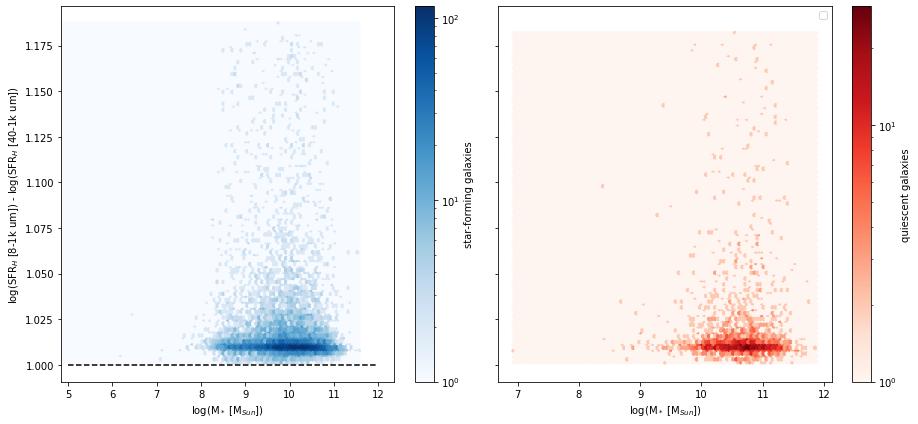

In [109]:
#%% Plotting Star formation rate vs Stellar mass
fig, axs = plt.subplots(1,2,sharey='row',figsize=(13,6))
axs[0].set_xlabel("log(M$_*$ [M$_{Sun}$])",fontsize=10)
axs[0].set_ylabel("log(SFR$_{H}$ [8-1k um]) - log(SFR$_{H}$ [40-1k um])",fontsize=10)
hb = axs[0].hexbin(table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'Mass_median'],
            table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'LIR_H']/table.query('(0.5<Z_BEST<0.6)&'+SF).loc[:,'LIR_H_40'],
            cmap='Blues',bins='log')
cb = fig.colorbar(hb, ax=axs[0])
cb.set_label('star-forming galaxies')
axs[0].plot([5,12],[1,1],'--',color='k',label='SFR$_{H}$ = SFR$_{24}$')
#axs[0].set_xlim(xmin=7,xmax=12)

axs[1].set_xlabel("log(M$_*$ [M$_{Sun}$])",fontsize=10)
hb = axs[1].hexbin(table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'Mass_median'],
            table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'LIR_H']/table.query('(0.5<Z_BEST<0.6)&'+quiescent).loc[:,'LIR_H_40'],
            cmap='Reds',bins='log')
cb = fig.colorbar(hb, ax=axs[1])
cb.set_label('quiescent galaxies')
#axs[1].plot([5,12],[1,1],'--',color='k',label='SFR$_{H}$ = SFR$_{24}$')
#axs[1].set_xlim(xmin=7,xmax=12)
#axs[1].set_ylim(ymin=0,ymax=4.6)
#axs[1].set_yscale('log')
axs[1].legend(numpoints=1, loc='best')
fig.tight_layout()
plt.show()

In [48]:
end_time=time()
print("Running notebook took {:.4g} seconds!".format(end_time-start_time))

# NOTEBOOK ENDS HERE